#Дипломная работа

In [ ]:
!pip uninstall tensorflow
!pip install tensorflow==1.14.0

Uninstalling tensorflow-2.2.0:
  Would remove:
    /usr/local/bin/estimator_ckpt_converter
    /usr/local/bin/saved_model_cli
    /usr/local/bin/tensorboard
    /usr/local/bin/tf_upgrade_v2
    /usr/local/bin/tflite_convert
    /usr/local/bin/toco
    /usr/local/bin/toco_from_protos
    /usr/local/lib/python3.6/dist-packages/tensorflow-2.2.0.dist-info/*
    /usr/local/lib/python3.6/dist-packages/tensorflow/*
Proceed (y/n)? y
  Successfully uninstalled tensorflow-2.2.0
     |████████████████████████████████| 109.2MB 26kB/s 
     |████████████████████████████████| 3.2MB 33.8MB/s 
     |████████████████████████████████| 491kB 50.9MB/s 
  Found existing installation: tensorboard 2.2.2
    Uninstalling tensorboard-2.2.2:
      Successfully uninstalled tensorboard-2.2.2
  Found existing installation: tensorflow-estimator 2.2.0
    Uninstalling tensorflow-estimator-2.2.0:
      Successfully uninstalled tensorflow-estimator-2.2.0


In [ ]:
%tensorflow_version 1.x
from __future__ import print_function, division
from tensorflow.keras.preprocessing import image
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, MaxPooling2D, concatenate, Embedding, multiply
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam, RMSprop
from google.colab import files
from google.colab import drive


from PIL import Image

import matplotlib.pyplot as plt
import glob
import sys

import numpy as np

TensorFlow 1.x selected.


Using TensorFlow backend.


In [ ]:
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
filelist = glob.glob("/content/gdrive/My Drive/Diplom/train/base/*")
xtrain = np.array([np.array(Image.open(fname).resize((64,64))) for fname in filelist])

In [ ]:
img_path = filelist[0]
plt.imshow(image.load_img(img_path))
plt.show()

In [ ]:
len(filelist)

2541

In [ ]:
img_rows = 64
img_cols = 64
channels = 3
img_shape = (img_rows, img_cols, channels)
latent_dim = 64

optimizer = Adam(0.0002, 0.5)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [ ]:
def create_generator(): 
  generator = Sequential() 

  generator.add(Dense(256,  input_dim=latent_dim)) 
  generator.add(LeakyReLU(alpha=0.2)) 
  generator.add(BatchNormalization(momentum=0.8)) 
  
  generator.add(Dense(256)) 
  generator.add(LeakyReLU(alpha=0.2)) 
  generator.add(BatchNormalization(momentum=0.8)) 
  
  generator.add(Dense(128)) 
  generator.add(LeakyReLU(alpha=0.2)) 
  generator.add(BatchNormalization(momentum=0.8)) 
  
  generator.add(Dense(128)) 
  generator.add(LeakyReLU(alpha=0.2)) 
  generator.add(BatchNormalization(momentum=0.8)) 
  
  generator.add(Dense(64)) 
  generator.add(LeakyReLU(alpha=0.2)) 
  generator.add(BatchNormalization(momentum=0.8)) 

  generator.add(Dense(64)) 
  generator.add(LeakyReLU(alpha=0.2)) 
  generator.add(BatchNormalization(momentum=0.8))
  
  generator.add(Dense(np.prod(img_shape), activation='tanh'))
  generator.add(Reshape(img_shape)) 
  
  generator.summary()

  return generator 

In [ ]:
def create_discriminator(): 
  discriminator = Sequential() 

  discriminator.add(Flatten(input_shape=img_shape)) 
  discriminator.add(Dense(256))  
  discriminator.add(LeakyReLU(alpha=0.2)) 
  
  discriminator.add(Dense(256))  
  discriminator.add(LeakyReLU(alpha=0.2))
  
  discriminator.add(Dense(128))  
  discriminator.add(LeakyReLU(alpha=0.2))
  
  discriminator.add(Dense(128)) 
  discriminator.add(LeakyReLU(alpha=0.2)) 

  discriminator.add(Dense(64)) 
  discriminator.add(LeakyReLU(alpha=0.2)) 

  discriminator.add(Dense(64)) 
  discriminator.add(LeakyReLU(alpha=0.2))
  
  discriminator.add(Dense(1, activation='sigmoid')) 

 
  discriminator.compile(loss='binary_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])
 
  discriminator.trainable = False

  discriminator.summary()
  
  return discriminator 

In [ ]:
batch_size = 32 

X_train = xtrain / 127.5 - 1. 

In [ ]:
def sample_images(epoch, gen): 
  r, c = 5, 5 
  noise = np.random.normal(0, 1, (r * c, latent_dim)) 
  gen_imgs = gen.predict(noise) 
  
  gen_imgs = 0.5 * gen_imgs + 0.5 

  fig, axs = plt.subplots(r, c) 
  cnt = 0 
  for i in range(r): 
      for j in range(c):
          axs[i,j].imshow(gen_imgs[cnt, :,:,:]) 
          axs[i,j].axis('off') 
          cnt += 1 
  plt.show() 
  fig.savefig("/content/gdrive/My Drive/Diplom/fase/%d.jpg" % epoch) 
  plt.close() 

In [ ]:
def train(generator, discriminator, epochs=15000, batch_size=batch_size):

  valid = np.ones((batch_size, 1)) 
  fake = np.zeros((batch_size, 1))
  
  z = Input(shape=(latent_dim,)) 
  img = generator(z) 
  validity = discriminator(img) 

  combined = Model(z, validity) 
  combined.compile(loss='binary_crossentropy', optimizer=optimizer) 

  sample_interval = 200 
  
  d_loss_list = [] 
  g_loss_list = [] 
  d_acc_list = [] 
  
  for epoch in range(epochs): 
    
    #  Train Discriminator
 
    idx = np.random.randint(0, X_train.shape[0], batch_size) 
    imgs = X_train[idx] 

    noise = np.random.normal(0, 1, (batch_size, latent_dim)) 
    
    gen_imgs = generator.predict(noise) 
      
    
    d_loss_real = discriminator.train_on_batch(imgs, valid) 
    d_loss_fake = discriminator.train_on_batch(gen_imgs, fake) 
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

    
    #  Train Generator
   

    g_loss = combined.train_on_batch(noise, valid) 
    
    print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss)) 

    d_loss_list.append(d_loss[0]) 
    g_loss_list.append(g_loss) 
    d_acc_list.append(100*d_loss[1]) 
        
    
    if ((epoch % sample_interval == 0) | (epoch == epochs-1)): 
        sample_images(epoch, generator) 
  
 
  plt.plot(d_loss_list, label="Ошибка дискриминатора")
  plt.plot(g_loss_list, label="Ошибка генератора")
  plt.legend()
  plt.show()
  plt.plot(d_acc_list, label="Точность распознавания дискриминатора")
  plt.legend()
  plt.show()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               16640     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
dense_2 (Dense)              (None, 256)               65792     
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 256)               1024      
_________________________________________________________________
dense_3 (Dense)              (None, 128)              

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'



0 [D loss: 0.588390, acc.: 50.00%] [G loss: 0.636091]


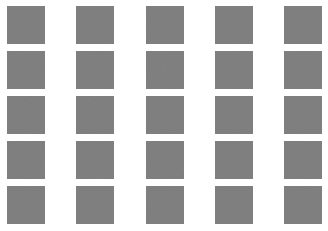

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


1 [D loss: 0.391415, acc.: 50.00%] [G loss: 0.616858]
2 [D loss: 0.367390, acc.: 50.00%] [G loss: 0.596968]
3 [D loss: 0.362111, acc.: 50.00%] [G loss: 0.578888]
4 [D loss: 0.358625, acc.: 50.00%] [G loss: 0.559629]
5 [D loss: 0.357808, acc.: 76.56%] [G loss: 0.545256]
6 [D loss: 0.359153, acc.: 78.12%] [G loss: 0.525804]
7 [D loss: 0.351945, acc.: 82.81%] [G loss: 0.497748]
8 [D loss: 0.353659, acc.: 87.50%] [G loss: 0.502632]
9 [D loss: 0.365286, acc.: 78.12%] [G loss: 0.515781]
10 [D loss: 0.378866, acc.: 68.75%] [G loss: 0.548798]
11 [D loss: 0.363490, acc.: 79.69%] [G loss: 0.587158]
12 [D loss: 0.346927, acc.: 82.81%] [G loss: 0.619957]
13 [D loss: 0.394966, acc.: 75.00%] [G loss: 0.679794]
14 [D loss: 0.349960, acc.: 78.12%] [G loss: 0.746231]
15 [D loss: 0.313275, acc.: 93.75%] [G loss: 0.799296]
16 [D loss: 0.315662, acc.: 95.31%] [G loss: 0.846322]
17 [D loss: 0.311634, acc.: 89.06%] [G loss: 0.923355]
18 [D loss: 0.277633, acc.: 98.44%] [G loss: 0.979343]
19 [D loss: 0.26948

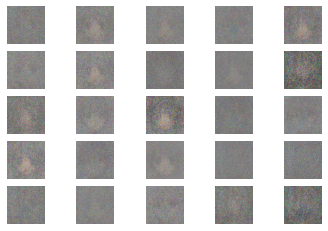

201 [D loss: 0.265896, acc.: 92.19%] [G loss: 1.596480]
202 [D loss: 0.156791, acc.: 96.88%] [G loss: 1.709899]
203 [D loss: 0.122180, acc.: 100.00%] [G loss: 1.948965]
204 [D loss: 0.146574, acc.: 98.44%] [G loss: 1.795987]
205 [D loss: 0.206494, acc.: 93.75%] [G loss: 1.515349]
206 [D loss: 0.190018, acc.: 92.19%] [G loss: 1.948589]
207 [D loss: 0.119666, acc.: 98.44%] [G loss: 2.139948]
208 [D loss: 0.201251, acc.: 92.19%] [G loss: 2.111079]
209 [D loss: 0.155874, acc.: 98.44%] [G loss: 2.042390]
210 [D loss: 0.296421, acc.: 84.38%] [G loss: 1.692282]
211 [D loss: 0.142623, acc.: 96.88%] [G loss: 2.032423]
212 [D loss: 0.079252, acc.: 100.00%] [G loss: 2.292103]
213 [D loss: 0.250491, acc.: 93.75%] [G loss: 1.605639]
214 [D loss: 0.264459, acc.: 90.62%] [G loss: 1.774621]
215 [D loss: 0.134301, acc.: 96.88%] [G loss: 1.990646]
216 [D loss: 0.164697, acc.: 98.44%] [G loss: 1.961700]
217 [D loss: 0.103845, acc.: 100.00%] [G loss: 1.984341]
218 [D loss: 0.203095, acc.: 96.88%] [G loss:

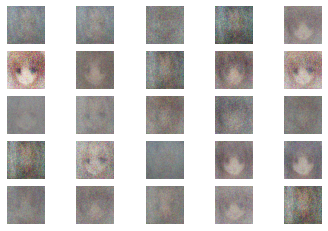

401 [D loss: 0.827437, acc.: 67.19%] [G loss: 2.418392]
402 [D loss: 0.124774, acc.: 98.44%] [G loss: 3.007804]
403 [D loss: 0.371715, acc.: 84.38%] [G loss: 2.011690]
404 [D loss: 0.216356, acc.: 89.06%] [G loss: 2.811831]
405 [D loss: 0.135981, acc.: 93.75%] [G loss: 3.294258]
406 [D loss: 0.070688, acc.: 100.00%] [G loss: 3.064936]
407 [D loss: 0.171279, acc.: 95.31%] [G loss: 2.667027]
408 [D loss: 0.073423, acc.: 100.00%] [G loss: 2.620183]
409 [D loss: 0.105457, acc.: 95.31%] [G loss: 2.620644]
410 [D loss: 0.082365, acc.: 100.00%] [G loss: 2.573621]
411 [D loss: 0.232641, acc.: 95.31%] [G loss: 3.227767]
412 [D loss: 0.283035, acc.: 90.62%] [G loss: 2.854954]
413 [D loss: 0.114229, acc.: 96.88%] [G loss: 2.786766]
414 [D loss: 0.150582, acc.: 95.31%] [G loss: 2.909020]
415 [D loss: 0.145291, acc.: 98.44%] [G loss: 2.452008]
416 [D loss: 0.454727, acc.: 85.94%] [G loss: 3.283126]
417 [D loss: 0.599028, acc.: 68.75%] [G loss: 2.307843]
418 [D loss: 0.082569, acc.: 96.88%] [G loss:

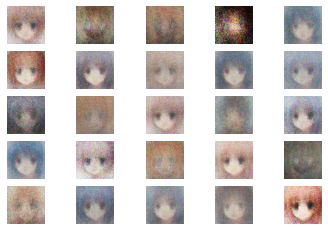

601 [D loss: 0.218865, acc.: 92.19%] [G loss: 2.936786]
602 [D loss: 0.329507, acc.: 87.50%] [G loss: 2.797348]
603 [D loss: 0.394444, acc.: 81.25%] [G loss: 2.838236]
604 [D loss: 0.276836, acc.: 95.31%] [G loss: 2.787651]
605 [D loss: 0.344321, acc.: 84.38%] [G loss: 2.033933]
606 [D loss: 0.145416, acc.: 98.44%] [G loss: 2.699175]
607 [D loss: 0.268459, acc.: 87.50%] [G loss: 2.648265]
608 [D loss: 0.213844, acc.: 93.75%] [G loss: 2.422265]
609 [D loss: 0.123389, acc.: 98.44%] [G loss: 2.180239]
610 [D loss: 0.189292, acc.: 93.75%] [G loss: 2.478242]
611 [D loss: 0.308604, acc.: 87.50%] [G loss: 2.777338]
612 [D loss: 0.392016, acc.: 84.38%] [G loss: 2.475012]
613 [D loss: 0.262628, acc.: 85.94%] [G loss: 3.112871]
614 [D loss: 0.551448, acc.: 71.88%] [G loss: 2.250611]
615 [D loss: 0.365894, acc.: 84.38%] [G loss: 3.027668]
616 [D loss: 0.360318, acc.: 84.38%] [G loss: 2.415030]
617 [D loss: 0.254186, acc.: 90.62%] [G loss: 2.685925]
618 [D loss: 0.198686, acc.: 95.31%] [G loss: 2.

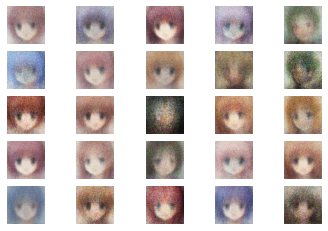

801 [D loss: 0.209647, acc.: 93.75%] [G loss: 2.592372]
802 [D loss: 0.324439, acc.: 90.62%] [G loss: 2.517350]
803 [D loss: 0.334851, acc.: 87.50%] [G loss: 2.168467]
804 [D loss: 0.222596, acc.: 92.19%] [G loss: 2.642863]
805 [D loss: 0.333791, acc.: 87.50%] [G loss: 2.319521]
806 [D loss: 0.306144, acc.: 90.62%] [G loss: 2.230476]
807 [D loss: 0.203560, acc.: 92.19%] [G loss: 2.860119]
808 [D loss: 0.324922, acc.: 85.94%] [G loss: 2.493187]
809 [D loss: 0.266228, acc.: 90.62%] [G loss: 2.025537]
810 [D loss: 0.212114, acc.: 92.19%] [G loss: 2.766741]
811 [D loss: 0.511102, acc.: 73.44%] [G loss: 2.347941]
812 [D loss: 0.248096, acc.: 93.75%] [G loss: 2.520895]
813 [D loss: 0.248068, acc.: 93.75%] [G loss: 3.176673]
814 [D loss: 0.368501, acc.: 81.25%] [G loss: 3.127610]
815 [D loss: 0.369930, acc.: 84.38%] [G loss: 2.688564]
816 [D loss: 0.448753, acc.: 85.94%] [G loss: 2.376895]
817 [D loss: 0.297935, acc.: 90.62%] [G loss: 2.545275]
818 [D loss: 0.131240, acc.: 96.88%] [G loss: 2.

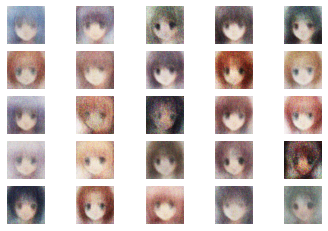

1001 [D loss: 0.311138, acc.: 87.50%] [G loss: 2.217623]
1002 [D loss: 0.505013, acc.: 71.88%] [G loss: 2.319632]
1003 [D loss: 0.492821, acc.: 75.00%] [G loss: 2.067753]
1004 [D loss: 0.540666, acc.: 71.88%] [G loss: 2.438514]
1005 [D loss: 0.480217, acc.: 75.00%] [G loss: 2.512000]
1006 [D loss: 0.446889, acc.: 85.94%] [G loss: 1.786206]
1007 [D loss: 0.256988, acc.: 95.31%] [G loss: 2.113242]
1008 [D loss: 0.344399, acc.: 87.50%] [G loss: 2.118276]
1009 [D loss: 0.412603, acc.: 81.25%] [G loss: 2.246793]
1010 [D loss: 0.364955, acc.: 82.81%] [G loss: 2.113879]
1011 [D loss: 0.325038, acc.: 82.81%] [G loss: 1.931488]
1012 [D loss: 0.436133, acc.: 85.94%] [G loss: 2.319936]
1013 [D loss: 0.198004, acc.: 96.88%] [G loss: 2.324611]
1014 [D loss: 0.478136, acc.: 81.25%] [G loss: 2.117223]
1015 [D loss: 0.291596, acc.: 89.06%] [G loss: 2.013995]
1016 [D loss: 0.441110, acc.: 75.00%] [G loss: 2.124580]
1017 [D loss: 0.433639, acc.: 76.56%] [G loss: 2.849969]
1018 [D loss: 0.524192, acc.: 7

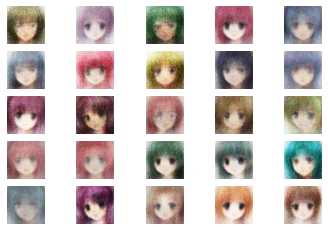

1201 [D loss: 0.373721, acc.: 82.81%] [G loss: 2.285022]
1202 [D loss: 0.337472, acc.: 89.06%] [G loss: 2.276378]
1203 [D loss: 0.323254, acc.: 84.38%] [G loss: 2.128064]
1204 [D loss: 0.273456, acc.: 93.75%] [G loss: 2.506693]
1205 [D loss: 0.477060, acc.: 78.12%] [G loss: 2.494653]
1206 [D loss: 0.509638, acc.: 75.00%] [G loss: 2.354645]
1207 [D loss: 0.391030, acc.: 78.12%] [G loss: 2.443537]
1208 [D loss: 0.339386, acc.: 82.81%] [G loss: 2.318030]
1209 [D loss: 0.455569, acc.: 79.69%] [G loss: 2.387004]
1210 [D loss: 0.313901, acc.: 85.94%] [G loss: 2.369901]
1211 [D loss: 0.418163, acc.: 75.00%] [G loss: 2.148614]
1212 [D loss: 0.470222, acc.: 75.00%] [G loss: 2.281255]
1213 [D loss: 0.265418, acc.: 90.62%] [G loss: 2.229786]
1214 [D loss: 0.620060, acc.: 62.50%] [G loss: 1.748982]
1215 [D loss: 0.314565, acc.: 85.94%] [G loss: 1.972246]
1216 [D loss: 0.404287, acc.: 84.38%] [G loss: 2.278268]
1217 [D loss: 0.310161, acc.: 85.94%] [G loss: 2.190697]
1218 [D loss: 0.317649, acc.: 8

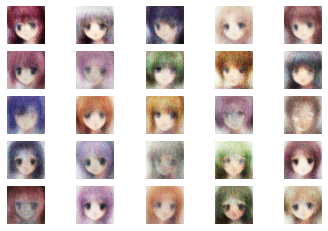

1401 [D loss: 0.506775, acc.: 76.56%] [G loss: 1.917817]
1402 [D loss: 0.440405, acc.: 78.12%] [G loss: 2.052729]
1403 [D loss: 0.422577, acc.: 81.25%] [G loss: 1.945557]
1404 [D loss: 0.408438, acc.: 81.25%] [G loss: 1.766324]
1405 [D loss: 0.474823, acc.: 73.44%] [G loss: 1.694647]
1406 [D loss: 0.524743, acc.: 73.44%] [G loss: 1.849162]
1407 [D loss: 0.402694, acc.: 84.38%] [G loss: 1.724245]
1408 [D loss: 0.467124, acc.: 79.69%] [G loss: 1.597739]
1409 [D loss: 0.407898, acc.: 76.56%] [G loss: 1.933793]
1410 [D loss: 0.601837, acc.: 73.44%] [G loss: 2.014568]
1411 [D loss: 0.524288, acc.: 71.88%] [G loss: 2.189612]
1412 [D loss: 0.397776, acc.: 79.69%] [G loss: 1.979173]
1413 [D loss: 0.502813, acc.: 75.00%] [G loss: 1.822142]
1414 [D loss: 0.413916, acc.: 79.69%] [G loss: 1.916174]
1415 [D loss: 0.469385, acc.: 75.00%] [G loss: 1.962593]
1416 [D loss: 0.368159, acc.: 85.94%] [G loss: 1.951855]
1417 [D loss: 0.310218, acc.: 89.06%] [G loss: 2.046253]
1418 [D loss: 0.794363, acc.: 5

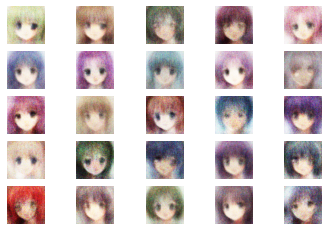

1601 [D loss: 0.521372, acc.: 75.00%] [G loss: 1.277945]
1602 [D loss: 0.524452, acc.: 76.56%] [G loss: 1.816589]
1603 [D loss: 0.460000, acc.: 76.56%] [G loss: 1.760961]
1604 [D loss: 0.507640, acc.: 78.12%] [G loss: 1.842693]
1605 [D loss: 0.466048, acc.: 82.81%] [G loss: 1.938071]
1606 [D loss: 0.293308, acc.: 90.62%] [G loss: 1.752442]
1607 [D loss: 0.403250, acc.: 79.69%] [G loss: 1.577485]
1608 [D loss: 0.340422, acc.: 87.50%] [G loss: 1.857696]
1609 [D loss: 0.479845, acc.: 78.12%] [G loss: 1.881938]
1610 [D loss: 0.581975, acc.: 65.62%] [G loss: 2.186861]
1611 [D loss: 0.535498, acc.: 75.00%] [G loss: 1.830705]
1612 [D loss: 0.504056, acc.: 81.25%] [G loss: 1.863097]
1613 [D loss: 0.437265, acc.: 78.12%] [G loss: 1.915592]
1614 [D loss: 0.460806, acc.: 78.12%] [G loss: 2.027967]
1615 [D loss: 0.450879, acc.: 76.56%] [G loss: 1.950469]
1616 [D loss: 0.295677, acc.: 87.50%] [G loss: 1.628634]
1617 [D loss: 0.430421, acc.: 81.25%] [G loss: 1.496954]
1618 [D loss: 0.415197, acc.: 8

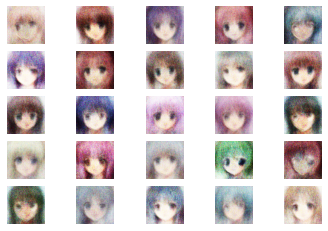

1801 [D loss: 0.414185, acc.: 79.69%] [G loss: 2.111388]
1802 [D loss: 0.555867, acc.: 71.88%] [G loss: 2.138242]
1803 [D loss: 0.386308, acc.: 85.94%] [G loss: 2.249356]
1804 [D loss: 0.329115, acc.: 85.94%] [G loss: 2.170492]
1805 [D loss: 0.469193, acc.: 79.69%] [G loss: 2.176670]
1806 [D loss: 0.571354, acc.: 71.88%] [G loss: 2.069564]
1807 [D loss: 0.388398, acc.: 84.38%] [G loss: 1.875303]
1808 [D loss: 0.689863, acc.: 62.50%] [G loss: 1.941294]
1809 [D loss: 0.552400, acc.: 67.19%] [G loss: 1.967795]
1810 [D loss: 0.364262, acc.: 87.50%] [G loss: 2.062337]
1811 [D loss: 0.528059, acc.: 75.00%] [G loss: 2.050187]
1812 [D loss: 0.573514, acc.: 71.88%] [G loss: 2.304635]
1813 [D loss: 0.419102, acc.: 76.56%] [G loss: 2.255328]
1814 [D loss: 0.457774, acc.: 82.81%] [G loss: 2.120313]
1815 [D loss: 0.440857, acc.: 79.69%] [G loss: 1.892815]
1816 [D loss: 0.712546, acc.: 75.00%] [G loss: 2.397365]
1817 [D loss: 0.611341, acc.: 70.31%] [G loss: 2.427696]
1818 [D loss: 0.367997, acc.: 8

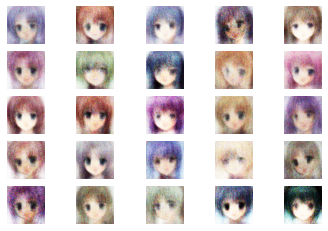

2001 [D loss: 0.394484, acc.: 81.25%] [G loss: 2.193838]
2002 [D loss: 0.347083, acc.: 84.38%] [G loss: 2.054897]
2003 [D loss: 0.507867, acc.: 78.12%] [G loss: 2.346452]
2004 [D loss: 0.376909, acc.: 85.94%] [G loss: 2.059892]
2005 [D loss: 0.516567, acc.: 78.12%] [G loss: 1.948723]
2006 [D loss: 0.455152, acc.: 73.44%] [G loss: 1.995840]
2007 [D loss: 0.358192, acc.: 89.06%] [G loss: 2.427893]
2008 [D loss: 0.440449, acc.: 78.12%] [G loss: 2.063631]
2009 [D loss: 0.405313, acc.: 78.12%] [G loss: 2.103575]
2010 [D loss: 0.342818, acc.: 87.50%] [G loss: 2.120291]
2011 [D loss: 0.457911, acc.: 81.25%] [G loss: 2.256606]
2012 [D loss: 0.346726, acc.: 85.94%] [G loss: 1.988891]
2013 [D loss: 0.407439, acc.: 79.69%] [G loss: 2.175031]
2014 [D loss: 0.447813, acc.: 79.69%] [G loss: 2.385425]
2015 [D loss: 0.412512, acc.: 78.12%] [G loss: 1.970526]
2016 [D loss: 0.458351, acc.: 76.56%] [G loss: 2.200779]
2017 [D loss: 0.306607, acc.: 84.38%] [G loss: 2.329206]
2018 [D loss: 0.336222, acc.: 8

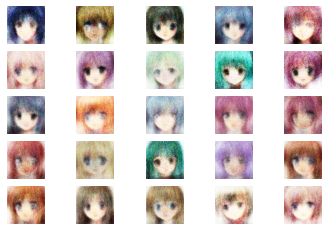

2201 [D loss: 0.447658, acc.: 81.25%] [G loss: 1.868052]
2202 [D loss: 0.382062, acc.: 81.25%] [G loss: 2.127698]
2203 [D loss: 0.524358, acc.: 78.12%] [G loss: 2.115427]
2204 [D loss: 0.387718, acc.: 84.38%] [G loss: 2.322316]
2205 [D loss: 0.319352, acc.: 89.06%] [G loss: 2.394746]
2206 [D loss: 0.540613, acc.: 71.88%] [G loss: 1.964116]
2207 [D loss: 0.373073, acc.: 84.38%] [G loss: 2.211048]
2208 [D loss: 0.446310, acc.: 81.25%] [G loss: 1.860124]
2209 [D loss: 0.376041, acc.: 87.50%] [G loss: 1.997372]
2210 [D loss: 0.480020, acc.: 73.44%] [G loss: 1.985323]
2211 [D loss: 0.328863, acc.: 90.62%] [G loss: 2.193415]
2212 [D loss: 0.394012, acc.: 85.94%] [G loss: 2.132373]
2213 [D loss: 0.505868, acc.: 78.12%] [G loss: 1.854208]
2214 [D loss: 0.503183, acc.: 75.00%] [G loss: 2.244477]
2215 [D loss: 0.268416, acc.: 90.62%] [G loss: 2.040525]
2216 [D loss: 0.584208, acc.: 70.31%] [G loss: 2.168252]
2217 [D loss: 0.454443, acc.: 81.25%] [G loss: 2.099561]
2218 [D loss: 0.396775, acc.: 8

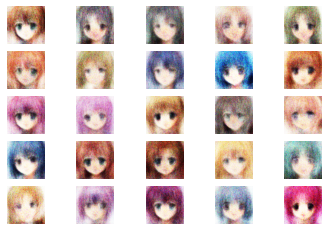

2401 [D loss: 0.523432, acc.: 78.12%] [G loss: 2.330856]
2402 [D loss: 0.362971, acc.: 81.25%] [G loss: 2.219931]
2403 [D loss: 0.366220, acc.: 78.12%] [G loss: 2.418761]
2404 [D loss: 0.333401, acc.: 87.50%] [G loss: 2.646558]
2405 [D loss: 0.465593, acc.: 81.25%] [G loss: 1.934149]
2406 [D loss: 0.391801, acc.: 81.25%] [G loss: 2.012193]
2407 [D loss: 0.336237, acc.: 85.94%] [G loss: 2.796887]
2408 [D loss: 0.403413, acc.: 84.38%] [G loss: 2.370321]
2409 [D loss: 0.460481, acc.: 81.25%] [G loss: 2.571186]
2410 [D loss: 0.436938, acc.: 78.12%] [G loss: 2.447294]
2411 [D loss: 0.554801, acc.: 71.88%] [G loss: 2.361022]
2412 [D loss: 0.411065, acc.: 82.81%] [G loss: 2.322018]
2413 [D loss: 0.310097, acc.: 90.62%] [G loss: 2.164081]
2414 [D loss: 0.370068, acc.: 85.94%] [G loss: 2.411989]
2415 [D loss: 0.391373, acc.: 81.25%] [G loss: 2.178848]
2416 [D loss: 0.427212, acc.: 79.69%] [G loss: 2.093799]
2417 [D loss: 0.376676, acc.: 85.94%] [G loss: 2.164161]
2418 [D loss: 0.363881, acc.: 8

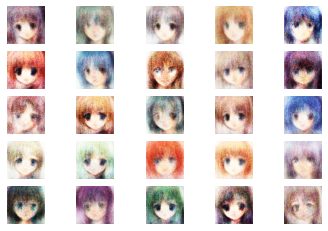

2601 [D loss: 0.412045, acc.: 82.81%] [G loss: 2.381522]
2602 [D loss: 0.272428, acc.: 90.62%] [G loss: 2.447036]
2603 [D loss: 0.474772, acc.: 79.69%] [G loss: 2.197743]
2604 [D loss: 0.480077, acc.: 78.12%] [G loss: 1.951262]
2605 [D loss: 0.423496, acc.: 79.69%] [G loss: 1.878278]
2606 [D loss: 0.360684, acc.: 87.50%] [G loss: 2.672508]
2607 [D loss: 0.451325, acc.: 78.12%] [G loss: 2.027052]
2608 [D loss: 0.488371, acc.: 73.44%] [G loss: 2.389552]
2609 [D loss: 0.304347, acc.: 87.50%] [G loss: 2.361542]
2610 [D loss: 0.445556, acc.: 73.44%] [G loss: 2.302917]
2611 [D loss: 0.512322, acc.: 78.12%] [G loss: 2.397286]
2612 [D loss: 0.429789, acc.: 76.56%] [G loss: 2.422458]
2613 [D loss: 0.574120, acc.: 71.88%] [G loss: 2.617475]
2614 [D loss: 0.390882, acc.: 84.38%] [G loss: 2.027146]
2615 [D loss: 0.519204, acc.: 76.56%] [G loss: 2.206404]
2616 [D loss: 0.202112, acc.: 95.31%] [G loss: 2.212098]
2617 [D loss: 0.370186, acc.: 81.25%] [G loss: 2.135071]
2618 [D loss: 0.389319, acc.: 8

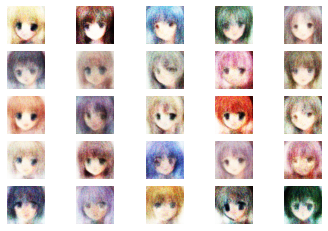

2801 [D loss: 0.400168, acc.: 79.69%] [G loss: 1.861775]
2802 [D loss: 0.527053, acc.: 76.56%] [G loss: 1.857882]
2803 [D loss: 0.333432, acc.: 82.81%] [G loss: 1.689681]
2804 [D loss: 0.394175, acc.: 85.94%] [G loss: 2.224096]
2805 [D loss: 0.246513, acc.: 93.75%] [G loss: 2.410811]
2806 [D loss: 0.378988, acc.: 81.25%] [G loss: 2.444516]
2807 [D loss: 0.393288, acc.: 85.94%] [G loss: 2.454637]
2808 [D loss: 0.373108, acc.: 81.25%] [G loss: 1.748348]
2809 [D loss: 0.528207, acc.: 81.25%] [G loss: 2.133271]
2810 [D loss: 0.281012, acc.: 85.94%] [G loss: 2.254107]
2811 [D loss: 0.325350, acc.: 82.81%] [G loss: 1.931924]
2812 [D loss: 0.400890, acc.: 79.69%] [G loss: 2.401068]
2813 [D loss: 0.288066, acc.: 90.62%] [G loss: 2.125479]
2814 [D loss: 0.471900, acc.: 75.00%] [G loss: 2.151276]
2815 [D loss: 0.399521, acc.: 76.56%] [G loss: 2.393157]
2816 [D loss: 0.375415, acc.: 78.12%] [G loss: 2.087259]
2817 [D loss: 0.352393, acc.: 87.50%] [G loss: 2.633589]
2818 [D loss: 0.261221, acc.: 9

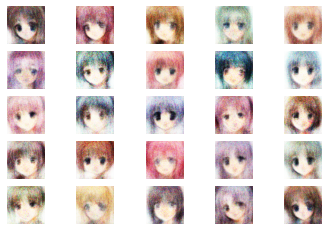

3001 [D loss: 0.568210, acc.: 78.12%] [G loss: 2.614630]
3002 [D loss: 0.442275, acc.: 82.81%] [G loss: 2.479418]
3003 [D loss: 0.436089, acc.: 79.69%] [G loss: 2.002770]
3004 [D loss: 0.313204, acc.: 92.19%] [G loss: 2.312367]
3005 [D loss: 0.435343, acc.: 79.69%] [G loss: 1.684836]
3006 [D loss: 0.294892, acc.: 87.50%] [G loss: 2.419093]
3007 [D loss: 0.593782, acc.: 73.44%] [G loss: 1.875992]
3008 [D loss: 0.418493, acc.: 82.81%] [G loss: 2.300171]
3009 [D loss: 0.399016, acc.: 75.00%] [G loss: 2.046599]
3010 [D loss: 0.314525, acc.: 87.50%] [G loss: 2.205106]
3011 [D loss: 0.327840, acc.: 85.94%] [G loss: 2.224909]
3012 [D loss: 0.357442, acc.: 81.25%] [G loss: 2.269737]
3013 [D loss: 0.345882, acc.: 85.94%] [G loss: 2.562406]
3014 [D loss: 0.333547, acc.: 87.50%] [G loss: 2.438313]
3015 [D loss: 0.513285, acc.: 73.44%] [G loss: 2.289180]
3016 [D loss: 0.340093, acc.: 87.50%] [G loss: 2.265919]
3017 [D loss: 0.408436, acc.: 79.69%] [G loss: 2.333232]
3018 [D loss: 0.536747, acc.: 7

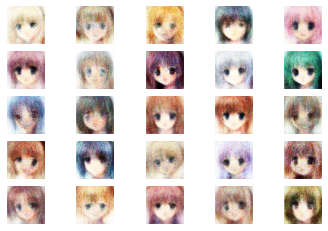

3201 [D loss: 0.417117, acc.: 79.69%] [G loss: 2.402929]
3202 [D loss: 0.315574, acc.: 87.50%] [G loss: 2.438991]
3203 [D loss: 0.294386, acc.: 82.81%] [G loss: 3.150810]
3204 [D loss: 0.484349, acc.: 78.12%] [G loss: 2.306045]
3205 [D loss: 0.280228, acc.: 85.94%] [G loss: 2.251787]
3206 [D loss: 0.300527, acc.: 89.06%] [G loss: 2.817047]
3207 [D loss: 0.225820, acc.: 93.75%] [G loss: 2.395818]
3208 [D loss: 0.342903, acc.: 84.38%] [G loss: 2.280704]
3209 [D loss: 0.374815, acc.: 85.94%] [G loss: 2.002118]
3210 [D loss: 0.286514, acc.: 85.94%] [G loss: 2.317233]
3211 [D loss: 0.305895, acc.: 89.06%] [G loss: 2.603488]
3212 [D loss: 0.525186, acc.: 76.56%] [G loss: 2.396721]
3213 [D loss: 0.329358, acc.: 90.62%] [G loss: 2.686115]
3214 [D loss: 0.284895, acc.: 89.06%] [G loss: 2.544388]
3215 [D loss: 0.297060, acc.: 85.94%] [G loss: 2.746542]
3216 [D loss: 0.379195, acc.: 87.50%] [G loss: 2.610343]
3217 [D loss: 0.382199, acc.: 79.69%] [G loss: 2.441800]
3218 [D loss: 0.474310, acc.: 7

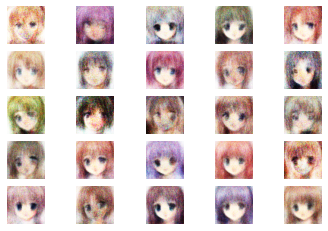

3401 [D loss: 0.191052, acc.: 95.31%] [G loss: 2.599495]
3402 [D loss: 0.315731, acc.: 85.94%] [G loss: 2.606598]
3403 [D loss: 0.282168, acc.: 84.38%] [G loss: 2.768211]
3404 [D loss: 0.281709, acc.: 90.62%] [G loss: 2.674570]
3405 [D loss: 0.435324, acc.: 79.69%] [G loss: 2.876750]
3406 [D loss: 0.471759, acc.: 78.12%] [G loss: 2.372517]
3407 [D loss: 0.430732, acc.: 81.25%] [G loss: 2.518471]
3408 [D loss: 0.396679, acc.: 85.94%] [G loss: 2.474490]
3409 [D loss: 0.300514, acc.: 90.62%] [G loss: 2.546939]
3410 [D loss: 0.390820, acc.: 85.94%] [G loss: 2.413825]
3411 [D loss: 0.403380, acc.: 87.50%] [G loss: 2.647211]
3412 [D loss: 0.516303, acc.: 78.12%] [G loss: 2.632140]
3413 [D loss: 0.364749, acc.: 82.81%] [G loss: 2.710595]
3414 [D loss: 0.407427, acc.: 82.81%] [G loss: 2.870646]
3415 [D loss: 0.239899, acc.: 89.06%] [G loss: 2.629093]
3416 [D loss: 0.287259, acc.: 85.94%] [G loss: 2.532701]
3417 [D loss: 0.410591, acc.: 84.38%] [G loss: 2.690486]
3418 [D loss: 0.350973, acc.: 8

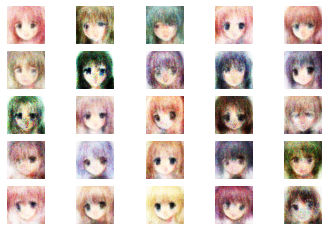

3601 [D loss: 0.363188, acc.: 84.38%] [G loss: 2.780191]
3602 [D loss: 0.242300, acc.: 89.06%] [G loss: 2.773079]
3603 [D loss: 0.357725, acc.: 84.38%] [G loss: 2.663036]
3604 [D loss: 0.253109, acc.: 90.62%] [G loss: 2.793854]
3605 [D loss: 0.319555, acc.: 90.62%] [G loss: 2.646739]
3606 [D loss: 0.359138, acc.: 87.50%] [G loss: 2.727919]
3607 [D loss: 0.514174, acc.: 78.12%] [G loss: 2.655324]
3608 [D loss: 0.176209, acc.: 92.19%] [G loss: 2.779519]
3609 [D loss: 0.455798, acc.: 79.69%] [G loss: 2.458466]
3610 [D loss: 0.304207, acc.: 87.50%] [G loss: 2.549723]
3611 [D loss: 0.252698, acc.: 85.94%] [G loss: 2.952160]
3612 [D loss: 0.455947, acc.: 76.56%] [G loss: 2.379862]
3613 [D loss: 0.558709, acc.: 78.12%] [G loss: 3.014844]
3614 [D loss: 0.326344, acc.: 87.50%] [G loss: 3.317548]
3615 [D loss: 0.459740, acc.: 82.81%] [G loss: 2.417315]
3616 [D loss: 0.353791, acc.: 84.38%] [G loss: 2.447417]
3617 [D loss: 0.296464, acc.: 87.50%] [G loss: 2.814231]
3618 [D loss: 0.434260, acc.: 7

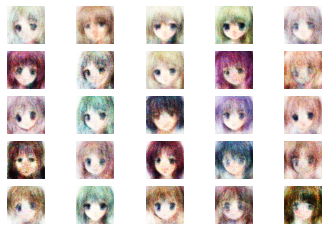

3801 [D loss: 0.182542, acc.: 92.19%] [G loss: 3.126522]
3802 [D loss: 0.128277, acc.: 95.31%] [G loss: 2.926760]
3803 [D loss: 0.301184, acc.: 85.94%] [G loss: 3.079857]
3804 [D loss: 0.276432, acc.: 89.06%] [G loss: 2.914918]
3805 [D loss: 0.435706, acc.: 79.69%] [G loss: 3.126485]
3806 [D loss: 0.506910, acc.: 79.69%] [G loss: 2.685967]
3807 [D loss: 0.254284, acc.: 90.62%] [G loss: 3.080886]
3808 [D loss: 0.308617, acc.: 87.50%] [G loss: 2.726363]
3809 [D loss: 0.465214, acc.: 79.69%] [G loss: 2.652468]
3810 [D loss: 0.288371, acc.: 85.94%] [G loss: 3.161463]
3811 [D loss: 0.260325, acc.: 90.62%] [G loss: 3.246535]
3812 [D loss: 0.266467, acc.: 85.94%] [G loss: 3.010204]
3813 [D loss: 0.241137, acc.: 89.06%] [G loss: 2.680974]
3814 [D loss: 0.192925, acc.: 92.19%] [G loss: 2.875104]
3815 [D loss: 0.417317, acc.: 79.69%] [G loss: 2.659509]
3816 [D loss: 0.243807, acc.: 89.06%] [G loss: 3.257845]
3817 [D loss: 0.409036, acc.: 81.25%] [G loss: 2.628009]
3818 [D loss: 0.174013, acc.: 9

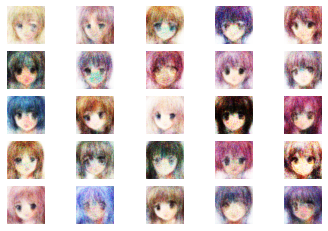

4001 [D loss: 0.388380, acc.: 82.81%] [G loss: 3.360405]
4002 [D loss: 0.233640, acc.: 89.06%] [G loss: 3.285306]
4003 [D loss: 0.299416, acc.: 92.19%] [G loss: 2.855324]
4004 [D loss: 0.367464, acc.: 81.25%] [G loss: 2.920233]
4005 [D loss: 0.293469, acc.: 84.38%] [G loss: 2.877569]
4006 [D loss: 0.228352, acc.: 90.62%] [G loss: 2.994670]
4007 [D loss: 0.237789, acc.: 92.19%] [G loss: 3.135300]
4008 [D loss: 0.267154, acc.: 87.50%] [G loss: 3.246077]
4009 [D loss: 0.180375, acc.: 93.75%] [G loss: 3.200182]
4010 [D loss: 0.184429, acc.: 92.19%] [G loss: 3.297348]
4011 [D loss: 0.232615, acc.: 89.06%] [G loss: 2.613547]
4012 [D loss: 0.336297, acc.: 89.06%] [G loss: 2.837377]
4013 [D loss: 0.359568, acc.: 84.38%] [G loss: 3.375053]
4014 [D loss: 0.129910, acc.: 98.44%] [G loss: 3.210031]
4015 [D loss: 0.364793, acc.: 81.25%] [G loss: 2.953768]
4016 [D loss: 0.278495, acc.: 85.94%] [G loss: 3.058094]
4017 [D loss: 0.415888, acc.: 87.50%] [G loss: 3.437635]
4018 [D loss: 0.214257, acc.: 9

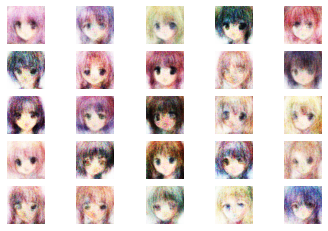

4201 [D loss: 0.148744, acc.: 96.88%] [G loss: 3.681066]
4202 [D loss: 0.151871, acc.: 95.31%] [G loss: 3.068282]
4203 [D loss: 0.212198, acc.: 93.75%] [G loss: 3.023284]
4204 [D loss: 0.364790, acc.: 82.81%] [G loss: 3.316052]
4205 [D loss: 0.286502, acc.: 85.94%] [G loss: 2.603505]
4206 [D loss: 0.347840, acc.: 90.62%] [G loss: 3.205253]
4207 [D loss: 0.383116, acc.: 79.69%] [G loss: 3.219393]
4208 [D loss: 0.314653, acc.: 89.06%] [G loss: 3.555774]
4209 [D loss: 0.449954, acc.: 81.25%] [G loss: 2.921015]
4210 [D loss: 0.256403, acc.: 89.06%] [G loss: 3.164467]
4211 [D loss: 0.308186, acc.: 89.06%] [G loss: 2.993347]
4212 [D loss: 0.081837, acc.: 98.44%] [G loss: 3.537987]
4213 [D loss: 0.164054, acc.: 93.75%] [G loss: 3.343935]
4214 [D loss: 0.233089, acc.: 93.75%] [G loss: 2.998456]
4215 [D loss: 0.330793, acc.: 85.94%] [G loss: 2.774293]
4216 [D loss: 0.335583, acc.: 85.94%] [G loss: 2.883372]
4217 [D loss: 0.240960, acc.: 89.06%] [G loss: 3.326172]
4218 [D loss: 0.299356, acc.: 8

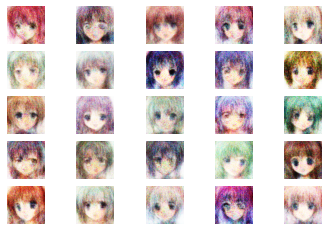

4401 [D loss: 0.279919, acc.: 89.06%] [G loss: 3.012404]
4402 [D loss: 0.131188, acc.: 95.31%] [G loss: 3.048892]
4403 [D loss: 0.273656, acc.: 92.19%] [G loss: 3.245367]
4404 [D loss: 0.279689, acc.: 90.62%] [G loss: 3.341066]
4405 [D loss: 0.178339, acc.: 90.62%] [G loss: 3.252351]
4406 [D loss: 0.355983, acc.: 89.06%] [G loss: 2.844436]
4407 [D loss: 0.152200, acc.: 96.88%] [G loss: 3.205558]
4408 [D loss: 0.139565, acc.: 96.88%] [G loss: 3.160666]
4409 [D loss: 0.350711, acc.: 84.38%] [G loss: 3.557399]
4410 [D loss: 0.146833, acc.: 90.62%] [G loss: 3.948392]
4411 [D loss: 0.529735, acc.: 75.00%] [G loss: 3.190472]
4412 [D loss: 0.311393, acc.: 85.94%] [G loss: 3.351200]
4413 [D loss: 0.174880, acc.: 93.75%] [G loss: 2.994202]
4414 [D loss: 0.258342, acc.: 85.94%] [G loss: 2.831553]
4415 [D loss: 0.394342, acc.: 84.38%] [G loss: 2.596802]
4416 [D loss: 0.152539, acc.: 93.75%] [G loss: 2.946560]
4417 [D loss: 0.141308, acc.: 95.31%] [G loss: 2.981725]
4418 [D loss: 0.313679, acc.: 8

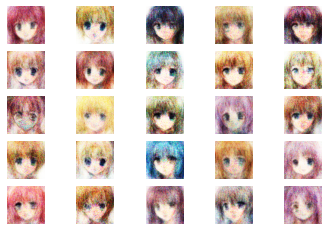

4601 [D loss: 0.239756, acc.: 92.19%] [G loss: 2.979684]
4602 [D loss: 0.108797, acc.: 96.88%] [G loss: 4.161560]
4603 [D loss: 0.418778, acc.: 82.81%] [G loss: 3.422603]
4604 [D loss: 0.154197, acc.: 96.88%] [G loss: 3.607010]
4605 [D loss: 0.177352, acc.: 95.31%] [G loss: 3.739081]
4606 [D loss: 0.286094, acc.: 87.50%] [G loss: 3.434104]
4607 [D loss: 0.216258, acc.: 89.06%] [G loss: 3.880035]
4608 [D loss: 0.286077, acc.: 84.38%] [G loss: 3.177606]
4609 [D loss: 0.173501, acc.: 93.75%] [G loss: 3.619946]
4610 [D loss: 0.304279, acc.: 89.06%] [G loss: 3.463927]
4611 [D loss: 0.226001, acc.: 93.75%] [G loss: 3.623366]
4612 [D loss: 0.195910, acc.: 92.19%] [G loss: 3.600224]
4613 [D loss: 0.547196, acc.: 75.00%] [G loss: 3.065364]
4614 [D loss: 0.298666, acc.: 90.62%] [G loss: 3.652307]
4615 [D loss: 0.304045, acc.: 87.50%] [G loss: 3.494277]
4616 [D loss: 0.326601, acc.: 85.94%] [G loss: 3.440536]
4617 [D loss: 0.269818, acc.: 90.62%] [G loss: 3.520509]
4618 [D loss: 0.236724, acc.: 9

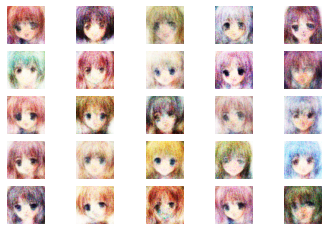

4801 [D loss: 0.200811, acc.: 93.75%] [G loss: 3.627756]
4802 [D loss: 0.273222, acc.: 85.94%] [G loss: 3.396862]
4803 [D loss: 0.188960, acc.: 90.62%] [G loss: 3.891258]
4804 [D loss: 0.196473, acc.: 90.62%] [G loss: 3.851345]
4805 [D loss: 0.318984, acc.: 84.38%] [G loss: 3.472379]
4806 [D loss: 0.341734, acc.: 89.06%] [G loss: 3.941786]
4807 [D loss: 0.597575, acc.: 76.56%] [G loss: 4.313666]
4808 [D loss: 0.240923, acc.: 92.19%] [G loss: 4.086384]
4809 [D loss: 0.406795, acc.: 78.12%] [G loss: 3.805331]
4810 [D loss: 0.210419, acc.: 89.06%] [G loss: 3.786724]
4811 [D loss: 0.152301, acc.: 95.31%] [G loss: 4.134068]
4812 [D loss: 0.294681, acc.: 89.06%] [G loss: 3.825832]
4813 [D loss: 0.110553, acc.: 96.88%] [G loss: 3.765673]
4814 [D loss: 0.206979, acc.: 92.19%] [G loss: 3.842904]
4815 [D loss: 0.457226, acc.: 79.69%] [G loss: 3.749656]
4816 [D loss: 0.277591, acc.: 87.50%] [G loss: 3.959660]
4817 [D loss: 0.227917, acc.: 89.06%] [G loss: 3.901462]
4818 [D loss: 0.262422, acc.: 8

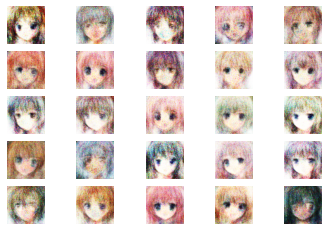

5001 [D loss: 0.136449, acc.: 98.44%] [G loss: 3.751825]
5002 [D loss: 0.122776, acc.: 93.75%] [G loss: 3.766583]
5003 [D loss: 0.127505, acc.: 96.88%] [G loss: 3.482678]
5004 [D loss: 0.150537, acc.: 93.75%] [G loss: 3.576900]
5005 [D loss: 0.231640, acc.: 92.19%] [G loss: 3.598341]
5006 [D loss: 0.255551, acc.: 87.50%] [G loss: 3.552902]
5007 [D loss: 0.125833, acc.: 95.31%] [G loss: 3.505511]
5008 [D loss: 0.227518, acc.: 92.19%] [G loss: 3.435978]
5009 [D loss: 0.217176, acc.: 90.62%] [G loss: 3.612369]
5010 [D loss: 0.130381, acc.: 95.31%] [G loss: 3.774247]
5011 [D loss: 0.300464, acc.: 90.62%] [G loss: 4.042121]
5012 [D loss: 0.207654, acc.: 93.75%] [G loss: 3.479417]
5013 [D loss: 0.219142, acc.: 92.19%] [G loss: 3.691159]
5014 [D loss: 0.172925, acc.: 93.75%] [G loss: 3.608297]
5015 [D loss: 0.185545, acc.: 90.62%] [G loss: 4.097797]
5016 [D loss: 0.219820, acc.: 90.62%] [G loss: 3.955266]
5017 [D loss: 0.300209, acc.: 89.06%] [G loss: 3.640545]
5018 [D loss: 0.295626, acc.: 8

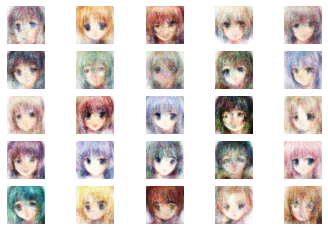

5201 [D loss: 0.267998, acc.: 90.62%] [G loss: 2.862244]
5202 [D loss: 0.177507, acc.: 92.19%] [G loss: 3.601572]
5203 [D loss: 0.198386, acc.: 93.75%] [G loss: 3.535514]
5204 [D loss: 0.160840, acc.: 95.31%] [G loss: 4.149515]
5205 [D loss: 0.283522, acc.: 89.06%] [G loss: 3.619087]
5206 [D loss: 0.143573, acc.: 95.31%] [G loss: 3.823479]
5207 [D loss: 0.099336, acc.: 95.31%] [G loss: 4.412672]
5208 [D loss: 0.206449, acc.: 92.19%] [G loss: 3.621072]
5209 [D loss: 0.321797, acc.: 87.50%] [G loss: 3.868854]
5210 [D loss: 0.143476, acc.: 93.75%] [G loss: 3.722728]
5211 [D loss: 0.116986, acc.: 96.88%] [G loss: 4.049048]
5212 [D loss: 0.093188, acc.: 95.31%] [G loss: 3.657652]
5213 [D loss: 0.252110, acc.: 84.38%] [G loss: 3.756588]
5214 [D loss: 0.202186, acc.: 89.06%] [G loss: 4.085240]
5215 [D loss: 0.174065, acc.: 92.19%] [G loss: 3.578970]
5216 [D loss: 0.289746, acc.: 85.94%] [G loss: 3.135064]
5217 [D loss: 0.270097, acc.: 85.94%] [G loss: 4.106033]
5218 [D loss: 0.324176, acc.: 8

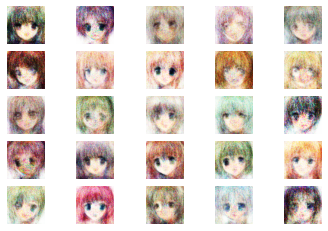

5401 [D loss: 0.193315, acc.: 92.19%] [G loss: 3.442948]
5402 [D loss: 0.169363, acc.: 92.19%] [G loss: 3.022227]
5403 [D loss: 0.123956, acc.: 95.31%] [G loss: 3.158004]
5404 [D loss: 0.123332, acc.: 93.75%] [G loss: 3.671162]
5405 [D loss: 0.138471, acc.: 93.75%] [G loss: 4.163833]
5406 [D loss: 0.059067, acc.: 98.44%] [G loss: 3.966650]
5407 [D loss: 0.154241, acc.: 93.75%] [G loss: 3.727767]
5408 [D loss: 0.185898, acc.: 93.75%] [G loss: 3.924023]
5409 [D loss: 0.267317, acc.: 85.94%] [G loss: 4.067107]
5410 [D loss: 0.276240, acc.: 90.62%] [G loss: 4.188379]
5411 [D loss: 0.124882, acc.: 93.75%] [G loss: 4.052515]
5412 [D loss: 0.080271, acc.: 96.88%] [G loss: 4.544633]
5413 [D loss: 0.209816, acc.: 89.06%] [G loss: 4.286101]
5414 [D loss: 0.185642, acc.: 95.31%] [G loss: 3.638193]
5415 [D loss: 0.130004, acc.: 95.31%] [G loss: 3.378381]
5416 [D loss: 0.159116, acc.: 90.62%] [G loss: 4.411977]
5417 [D loss: 0.102888, acc.: 96.88%] [G loss: 4.182765]
5418 [D loss: 0.186095, acc.: 9

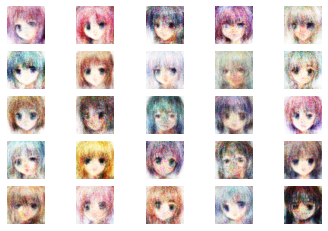

5601 [D loss: 0.249970, acc.: 89.06%] [G loss: 3.703681]
5602 [D loss: 0.197078, acc.: 89.06%] [G loss: 4.219373]
5603 [D loss: 0.204553, acc.: 93.75%] [G loss: 3.924846]
5604 [D loss: 0.147392, acc.: 90.62%] [G loss: 4.063944]
5605 [D loss: 0.092582, acc.: 100.00%] [G loss: 3.652919]
5606 [D loss: 0.133328, acc.: 93.75%] [G loss: 4.329876]
5607 [D loss: 0.204873, acc.: 95.31%] [G loss: 4.138030]
5608 [D loss: 0.114830, acc.: 95.31%] [G loss: 3.614161]
5609 [D loss: 0.179755, acc.: 95.31%] [G loss: 3.916356]
5610 [D loss: 0.207863, acc.: 95.31%] [G loss: 4.086726]
5611 [D loss: 0.068042, acc.: 98.44%] [G loss: 4.163512]
5612 [D loss: 0.148110, acc.: 95.31%] [G loss: 3.926273]
5613 [D loss: 0.172102, acc.: 95.31%] [G loss: 3.961125]
5614 [D loss: 0.216541, acc.: 95.31%] [G loss: 3.944308]
5615 [D loss: 0.101731, acc.: 95.31%] [G loss: 4.110663]
5616 [D loss: 0.215748, acc.: 92.19%] [G loss: 3.796726]
5617 [D loss: 0.164606, acc.: 96.88%] [G loss: 3.690289]
5618 [D loss: 0.154297, acc.: 

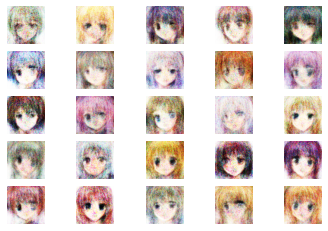

5801 [D loss: 0.176334, acc.: 90.62%] [G loss: 4.409748]
5802 [D loss: 0.142191, acc.: 96.88%] [G loss: 4.638147]
5803 [D loss: 0.344190, acc.: 89.06%] [G loss: 4.066184]
5804 [D loss: 0.198674, acc.: 93.75%] [G loss: 3.901543]
5805 [D loss: 0.208118, acc.: 87.50%] [G loss: 4.048950]
5806 [D loss: 0.151365, acc.: 93.75%] [G loss: 3.722865]
5807 [D loss: 0.299003, acc.: 85.94%] [G loss: 3.919235]
5808 [D loss: 0.101176, acc.: 98.44%] [G loss: 4.171593]
5809 [D loss: 0.328820, acc.: 89.06%] [G loss: 3.540277]
5810 [D loss: 0.134056, acc.: 93.75%] [G loss: 4.082257]
5811 [D loss: 0.104269, acc.: 95.31%] [G loss: 4.148722]
5812 [D loss: 0.228117, acc.: 93.75%] [G loss: 3.781969]
5813 [D loss: 0.176322, acc.: 92.19%] [G loss: 3.909065]
5814 [D loss: 0.068784, acc.: 98.44%] [G loss: 4.218040]
5815 [D loss: 0.097501, acc.: 96.88%] [G loss: 4.140007]
5816 [D loss: 0.179271, acc.: 89.06%] [G loss: 4.258806]
5817 [D loss: 0.164627, acc.: 90.62%] [G loss: 3.807742]
5818 [D loss: 0.176476, acc.: 9

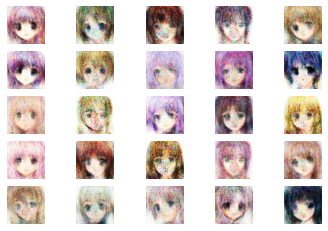

6001 [D loss: 0.136396, acc.: 93.75%] [G loss: 4.123022]
6002 [D loss: 0.125110, acc.: 95.31%] [G loss: 3.657834]
6003 [D loss: 0.124611, acc.: 96.88%] [G loss: 4.150437]
6004 [D loss: 0.065920, acc.: 98.44%] [G loss: 4.336190]
6005 [D loss: 0.271250, acc.: 90.62%] [G loss: 4.027439]
6006 [D loss: 0.068346, acc.: 96.88%] [G loss: 3.907250]
6007 [D loss: 0.151598, acc.: 92.19%] [G loss: 4.399994]
6008 [D loss: 0.130112, acc.: 96.88%] [G loss: 3.967303]
6009 [D loss: 0.201955, acc.: 90.62%] [G loss: 4.083220]
6010 [D loss: 0.144153, acc.: 95.31%] [G loss: 3.575630]
6011 [D loss: 0.142550, acc.: 93.75%] [G loss: 3.903030]
6012 [D loss: 0.145326, acc.: 95.31%] [G loss: 4.511417]
6013 [D loss: 0.097725, acc.: 98.44%] [G loss: 4.776161]
6014 [D loss: 0.167743, acc.: 95.31%] [G loss: 4.082471]
6015 [D loss: 0.185144, acc.: 95.31%] [G loss: 3.672113]
6016 [D loss: 0.310327, acc.: 90.62%] [G loss: 5.075294]
6017 [D loss: 0.145688, acc.: 92.19%] [G loss: 3.571791]
6018 [D loss: 0.169967, acc.: 9

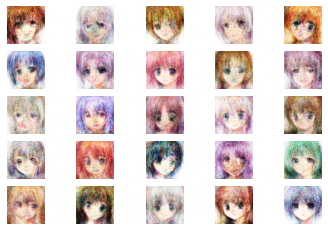

6201 [D loss: 0.345711, acc.: 82.81%] [G loss: 4.117607]
6202 [D loss: 0.118268, acc.: 95.31%] [G loss: 3.837117]
6203 [D loss: 0.045526, acc.: 98.44%] [G loss: 4.332977]
6204 [D loss: 0.125272, acc.: 93.75%] [G loss: 4.594963]
6205 [D loss: 0.255565, acc.: 89.06%] [G loss: 4.329321]
6206 [D loss: 0.241286, acc.: 84.38%] [G loss: 3.875891]
6207 [D loss: 0.183931, acc.: 93.75%] [G loss: 4.377417]
6208 [D loss: 0.189169, acc.: 92.19%] [G loss: 4.282722]
6209 [D loss: 0.159482, acc.: 95.31%] [G loss: 4.055784]
6210 [D loss: 0.233583, acc.: 92.19%] [G loss: 3.436749]
6211 [D loss: 0.146948, acc.: 95.31%] [G loss: 4.779531]
6212 [D loss: 0.194669, acc.: 95.31%] [G loss: 4.326565]
6213 [D loss: 0.112803, acc.: 96.88%] [G loss: 3.957011]
6214 [D loss: 0.137909, acc.: 93.75%] [G loss: 3.844665]
6215 [D loss: 0.073619, acc.: 100.00%] [G loss: 3.619269]
6216 [D loss: 0.204068, acc.: 90.62%] [G loss: 4.192094]
6217 [D loss: 0.107011, acc.: 95.31%] [G loss: 4.586851]
6218 [D loss: 0.153800, acc.: 

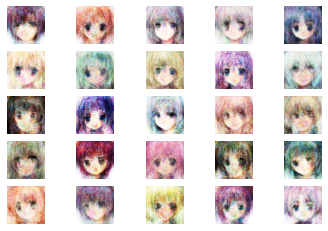

6401 [D loss: 0.333972, acc.: 85.94%] [G loss: 4.455083]
6402 [D loss: 0.134229, acc.: 95.31%] [G loss: 4.106798]
6403 [D loss: 0.178287, acc.: 93.75%] [G loss: 3.358149]
6404 [D loss: 0.222821, acc.: 92.19%] [G loss: 4.359824]
6405 [D loss: 0.131484, acc.: 93.75%] [G loss: 4.659365]
6406 [D loss: 0.101413, acc.: 95.31%] [G loss: 4.210815]
6407 [D loss: 0.108151, acc.: 95.31%] [G loss: 5.273062]
6408 [D loss: 0.198339, acc.: 90.62%] [G loss: 4.538021]
6409 [D loss: 0.271512, acc.: 93.75%] [G loss: 4.589111]
6410 [D loss: 0.152605, acc.: 95.31%] [G loss: 4.434358]
6411 [D loss: 0.115994, acc.: 96.88%] [G loss: 4.575058]
6412 [D loss: 0.103863, acc.: 95.31%] [G loss: 4.447061]
6413 [D loss: 0.121851, acc.: 96.88%] [G loss: 4.142436]
6414 [D loss: 0.123055, acc.: 95.31%] [G loss: 4.123185]
6415 [D loss: 0.186611, acc.: 93.75%] [G loss: 4.636879]
6416 [D loss: 0.153971, acc.: 93.75%] [G loss: 4.050354]
6417 [D loss: 0.310585, acc.: 85.94%] [G loss: 4.623298]
6418 [D loss: 0.131286, acc.: 9

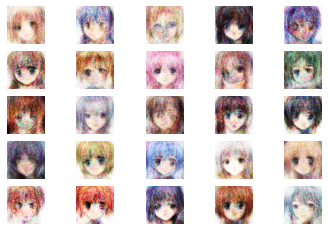

6601 [D loss: 0.176964, acc.: 93.75%] [G loss: 4.222953]
6602 [D loss: 0.144468, acc.: 92.19%] [G loss: 4.181931]
6603 [D loss: 0.345502, acc.: 82.81%] [G loss: 3.755160]
6604 [D loss: 0.152284, acc.: 90.62%] [G loss: 4.493068]
6605 [D loss: 0.129278, acc.: 96.88%] [G loss: 4.921191]
6606 [D loss: 0.286434, acc.: 90.62%] [G loss: 4.345366]
6607 [D loss: 0.149702, acc.: 95.31%] [G loss: 5.356557]
6608 [D loss: 0.187733, acc.: 93.75%] [G loss: 4.269820]
6609 [D loss: 0.263934, acc.: 92.19%] [G loss: 4.729919]
6610 [D loss: 0.125812, acc.: 96.88%] [G loss: 4.297732]
6611 [D loss: 0.244453, acc.: 92.19%] [G loss: 4.123146]
6612 [D loss: 0.102295, acc.: 98.44%] [G loss: 4.631605]
6613 [D loss: 0.157257, acc.: 95.31%] [G loss: 5.118875]
6614 [D loss: 0.275288, acc.: 89.06%] [G loss: 4.818465]
6615 [D loss: 0.295012, acc.: 89.06%] [G loss: 4.522562]
6616 [D loss: 0.307687, acc.: 87.50%] [G loss: 4.165511]
6617 [D loss: 0.095980, acc.: 95.31%] [G loss: 4.553164]
6618 [D loss: 0.264452, acc.: 8

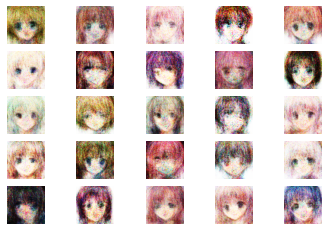

6801 [D loss: 0.276771, acc.: 92.19%] [G loss: 4.451999]
6802 [D loss: 0.232614, acc.: 87.50%] [G loss: 5.566518]
6803 [D loss: 0.196025, acc.: 89.06%] [G loss: 4.386415]
6804 [D loss: 0.243162, acc.: 92.19%] [G loss: 3.601310]
6805 [D loss: 0.062656, acc.: 98.44%] [G loss: 3.996336]
6806 [D loss: 0.075034, acc.: 96.88%] [G loss: 4.012321]
6807 [D loss: 0.074864, acc.: 96.88%] [G loss: 4.293601]
6808 [D loss: 0.112648, acc.: 95.31%] [G loss: 4.427118]
6809 [D loss: 0.278361, acc.: 87.50%] [G loss: 3.849236]
6810 [D loss: 0.153284, acc.: 93.75%] [G loss: 4.659082]
6811 [D loss: 0.164569, acc.: 92.19%] [G loss: 4.184652]
6812 [D loss: 0.106553, acc.: 98.44%] [G loss: 4.255196]
6813 [D loss: 0.137694, acc.: 92.19%] [G loss: 5.311584]
6814 [D loss: 0.056346, acc.: 100.00%] [G loss: 5.259609]
6815 [D loss: 0.278144, acc.: 92.19%] [G loss: 4.274827]
6816 [D loss: 0.111617, acc.: 96.88%] [G loss: 4.602339]
6817 [D loss: 0.136018, acc.: 95.31%] [G loss: 4.645200]
6818 [D loss: 0.286375, acc.: 

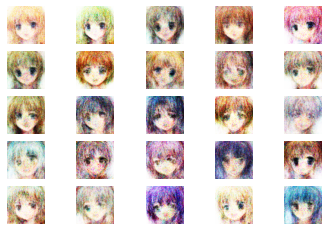

7001 [D loss: 0.084878, acc.: 96.88%] [G loss: 4.774720]
7002 [D loss: 0.284650, acc.: 87.50%] [G loss: 4.600662]
7003 [D loss: 0.115284, acc.: 96.88%] [G loss: 4.670794]
7004 [D loss: 0.084123, acc.: 96.88%] [G loss: 4.640351]
7005 [D loss: 0.151727, acc.: 92.19%] [G loss: 4.633290]
7006 [D loss: 0.091950, acc.: 95.31%] [G loss: 5.068471]
7007 [D loss: 0.207134, acc.: 92.19%] [G loss: 4.321474]
7008 [D loss: 0.094731, acc.: 96.88%] [G loss: 4.975404]
7009 [D loss: 0.187085, acc.: 90.62%] [G loss: 4.824648]
7010 [D loss: 0.112817, acc.: 93.75%] [G loss: 4.979315]
7011 [D loss: 0.094371, acc.: 95.31%] [G loss: 4.850945]
7012 [D loss: 0.127101, acc.: 96.88%] [G loss: 4.338460]
7013 [D loss: 0.092720, acc.: 96.88%] [G loss: 4.827963]
7014 [D loss: 0.095732, acc.: 96.88%] [G loss: 4.861669]
7015 [D loss: 0.164413, acc.: 95.31%] [G loss: 4.458058]
7016 [D loss: 0.070181, acc.: 98.44%] [G loss: 5.019884]
7017 [D loss: 0.105417, acc.: 95.31%] [G loss: 4.980190]
7018 [D loss: 0.149203, acc.: 8

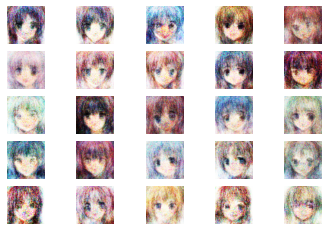

7201 [D loss: 0.070341, acc.: 98.44%] [G loss: 4.105022]
7202 [D loss: 0.079093, acc.: 96.88%] [G loss: 4.430412]
7203 [D loss: 0.088701, acc.: 96.88%] [G loss: 5.320464]
7204 [D loss: 0.135468, acc.: 95.31%] [G loss: 4.479968]
7205 [D loss: 0.100517, acc.: 95.31%] [G loss: 4.545177]
7206 [D loss: 0.207798, acc.: 90.62%] [G loss: 5.289105]
7207 [D loss: 0.164690, acc.: 90.62%] [G loss: 5.506577]
7208 [D loss: 0.204336, acc.: 96.88%] [G loss: 4.366429]
7209 [D loss: 0.152143, acc.: 93.75%] [G loss: 4.664350]
7210 [D loss: 0.069255, acc.: 96.88%] [G loss: 4.569200]
7211 [D loss: 0.084473, acc.: 96.88%] [G loss: 4.923164]
7212 [D loss: 0.180497, acc.: 93.75%] [G loss: 5.383451]
7213 [D loss: 0.143478, acc.: 95.31%] [G loss: 5.020556]
7214 [D loss: 0.133054, acc.: 95.31%] [G loss: 4.370070]
7215 [D loss: 0.074492, acc.: 100.00%] [G loss: 4.309304]
7216 [D loss: 0.124456, acc.: 93.75%] [G loss: 5.255686]
7217 [D loss: 0.073559, acc.: 98.44%] [G loss: 5.239085]
7218 [D loss: 0.097916, acc.: 

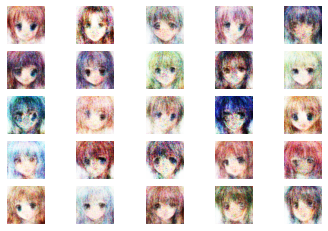

7401 [D loss: 0.066522, acc.: 98.44%] [G loss: 4.989576]
7402 [D loss: 0.031148, acc.: 100.00%] [G loss: 4.563425]
7403 [D loss: 0.102813, acc.: 95.31%] [G loss: 5.111907]
7404 [D loss: 0.071215, acc.: 98.44%] [G loss: 5.017495]
7405 [D loss: 0.061990, acc.: 98.44%] [G loss: 4.527869]
7406 [D loss: 0.130578, acc.: 96.88%] [G loss: 4.322453]
7407 [D loss: 0.154172, acc.: 95.31%] [G loss: 5.069120]
7408 [D loss: 0.045581, acc.: 98.44%] [G loss: 5.280254]
7409 [D loss: 0.036271, acc.: 100.00%] [G loss: 5.146273]
7410 [D loss: 0.088673, acc.: 96.88%] [G loss: 5.496112]
7411 [D loss: 0.098924, acc.: 93.75%] [G loss: 4.495328]
7412 [D loss: 0.113679, acc.: 96.88%] [G loss: 3.915176]
7413 [D loss: 0.134562, acc.: 98.44%] [G loss: 4.538880]
7414 [D loss: 0.228292, acc.: 92.19%] [G loss: 4.504800]
7415 [D loss: 0.182006, acc.: 89.06%] [G loss: 4.086401]
7416 [D loss: 0.086461, acc.: 98.44%] [G loss: 4.468567]
7417 [D loss: 0.103659, acc.: 96.88%] [G loss: 4.348490]
7418 [D loss: 0.205240, acc.:

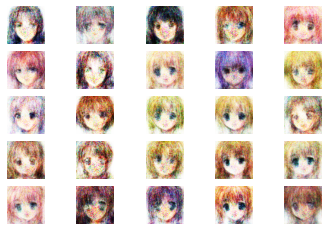

7601 [D loss: 0.201191, acc.: 92.19%] [G loss: 4.969235]
7602 [D loss: 0.132705, acc.: 96.88%] [G loss: 5.408259]
7603 [D loss: 0.181008, acc.: 90.62%] [G loss: 4.846093]
7604 [D loss: 0.238181, acc.: 90.62%] [G loss: 5.040365]
7605 [D loss: 0.142599, acc.: 93.75%] [G loss: 4.782406]
7606 [D loss: 0.046758, acc.: 100.00%] [G loss: 4.365467]
7607 [D loss: 0.058082, acc.: 96.88%] [G loss: 4.812605]
7608 [D loss: 0.019931, acc.: 100.00%] [G loss: 5.041631]
7609 [D loss: 0.218250, acc.: 92.19%] [G loss: 5.593754]
7610 [D loss: 0.081936, acc.: 96.88%] [G loss: 4.634652]
7611 [D loss: 0.146504, acc.: 93.75%] [G loss: 5.284229]
7612 [D loss: 0.104201, acc.: 95.31%] [G loss: 5.278044]
7613 [D loss: 0.073490, acc.: 98.44%] [G loss: 5.029980]
7614 [D loss: 0.042558, acc.: 98.44%] [G loss: 5.344006]
7615 [D loss: 0.268025, acc.: 89.06%] [G loss: 5.000351]
7616 [D loss: 0.072387, acc.: 98.44%] [G loss: 4.521369]
7617 [D loss: 0.120746, acc.: 95.31%] [G loss: 4.275030]
7618 [D loss: 0.225994, acc.:

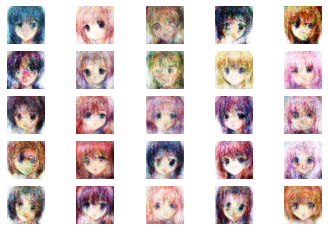

7801 [D loss: 0.140171, acc.: 95.31%] [G loss: 5.019432]
7802 [D loss: 0.090971, acc.: 95.31%] [G loss: 4.372286]
7803 [D loss: 0.032832, acc.: 100.00%] [G loss: 4.803925]
7804 [D loss: 0.346234, acc.: 90.62%] [G loss: 5.205389]
7805 [D loss: 0.254699, acc.: 87.50%] [G loss: 5.205509]
7806 [D loss: 0.210593, acc.: 92.19%] [G loss: 5.255727]
7807 [D loss: 0.133894, acc.: 95.31%] [G loss: 4.359783]
7808 [D loss: 0.339083, acc.: 81.25%] [G loss: 6.192042]
7809 [D loss: 0.200809, acc.: 92.19%] [G loss: 5.362946]
7810 [D loss: 0.291134, acc.: 81.25%] [G loss: 4.643291]
7811 [D loss: 0.097676, acc.: 95.31%] [G loss: 4.554864]
7812 [D loss: 0.094186, acc.: 98.44%] [G loss: 5.504307]
7813 [D loss: 0.180449, acc.: 92.19%] [G loss: 4.909861]
7814 [D loss: 0.095003, acc.: 98.44%] [G loss: 4.458668]
7815 [D loss: 0.259350, acc.: 85.94%] [G loss: 4.803323]
7816 [D loss: 0.082444, acc.: 95.31%] [G loss: 5.185871]
7817 [D loss: 0.141522, acc.: 95.31%] [G loss: 6.092038]
7818 [D loss: 0.196950, acc.: 

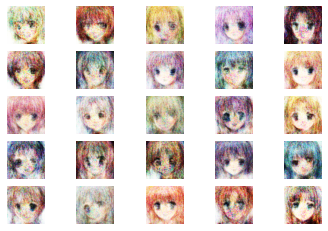

8001 [D loss: 0.073476, acc.: 98.44%] [G loss: 4.965183]
8002 [D loss: 0.122899, acc.: 95.31%] [G loss: 5.080661]
8003 [D loss: 0.098686, acc.: 96.88%] [G loss: 5.605254]
8004 [D loss: 0.039815, acc.: 100.00%] [G loss: 5.316855]
8005 [D loss: 0.155213, acc.: 92.19%] [G loss: 4.608571]
8006 [D loss: 0.124361, acc.: 95.31%] [G loss: 5.318442]
8007 [D loss: 0.071562, acc.: 96.88%] [G loss: 4.563129]
8008 [D loss: 0.146948, acc.: 95.31%] [G loss: 4.481410]
8009 [D loss: 0.179093, acc.: 89.06%] [G loss: 5.282482]
8010 [D loss: 0.077414, acc.: 96.88%] [G loss: 4.789243]
8011 [D loss: 0.142960, acc.: 93.75%] [G loss: 4.918695]
8012 [D loss: 0.174481, acc.: 92.19%] [G loss: 5.298636]
8013 [D loss: 0.120454, acc.: 95.31%] [G loss: 5.822278]
8014 [D loss: 0.152835, acc.: 90.62%] [G loss: 4.482764]
8015 [D loss: 0.086000, acc.: 98.44%] [G loss: 5.327310]
8016 [D loss: 0.130856, acc.: 92.19%] [G loss: 4.738869]
8017 [D loss: 0.159777, acc.: 92.19%] [G loss: 4.310246]
8018 [D loss: 0.076770, acc.: 

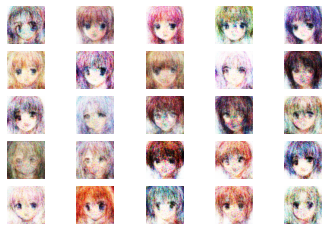

8201 [D loss: 0.177422, acc.: 92.19%] [G loss: 4.659590]
8202 [D loss: 0.122772, acc.: 92.19%] [G loss: 4.671147]
8203 [D loss: 0.059814, acc.: 98.44%] [G loss: 5.559264]
8204 [D loss: 0.045029, acc.: 98.44%] [G loss: 5.683460]
8205 [D loss: 0.065930, acc.: 98.44%] [G loss: 5.222769]
8206 [D loss: 0.062433, acc.: 98.44%] [G loss: 5.007734]
8207 [D loss: 0.104405, acc.: 92.19%] [G loss: 4.912779]
8208 [D loss: 0.072243, acc.: 95.31%] [G loss: 5.644399]
8209 [D loss: 0.074417, acc.: 98.44%] [G loss: 4.552748]
8210 [D loss: 0.159979, acc.: 95.31%] [G loss: 4.216002]
8211 [D loss: 0.047036, acc.: 100.00%] [G loss: 4.520761]
8212 [D loss: 0.096189, acc.: 96.88%] [G loss: 5.443184]
8213 [D loss: 0.060731, acc.: 96.88%] [G loss: 5.101886]
8214 [D loss: 0.196935, acc.: 93.75%] [G loss: 5.178258]
8215 [D loss: 0.103345, acc.: 95.31%] [G loss: 5.321243]
8216 [D loss: 0.113223, acc.: 95.31%] [G loss: 5.660907]
8217 [D loss: 0.103372, acc.: 96.88%] [G loss: 6.356885]
8218 [D loss: 0.097541, acc.: 

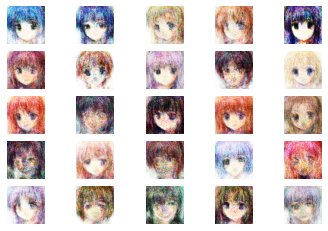

8401 [D loss: 0.119738, acc.: 95.31%] [G loss: 5.157130]
8402 [D loss: 0.055191, acc.: 98.44%] [G loss: 5.219714]
8403 [D loss: 0.074958, acc.: 96.88%] [G loss: 4.994017]
8404 [D loss: 0.039577, acc.: 98.44%] [G loss: 5.265610]
8405 [D loss: 0.233003, acc.: 92.19%] [G loss: 4.815022]
8406 [D loss: 0.109145, acc.: 96.88%] [G loss: 5.214597]
8407 [D loss: 0.116111, acc.: 95.31%] [G loss: 5.431727]
8408 [D loss: 0.111785, acc.: 96.88%] [G loss: 5.134634]
8409 [D loss: 0.274230, acc.: 90.62%] [G loss: 5.191764]
8410 [D loss: 0.053365, acc.: 98.44%] [G loss: 5.426921]
8411 [D loss: 0.145225, acc.: 93.75%] [G loss: 5.054351]
8412 [D loss: 0.328321, acc.: 89.06%] [G loss: 4.944873]
8413 [D loss: 0.042257, acc.: 100.00%] [G loss: 4.841512]
8414 [D loss: 0.040535, acc.: 100.00%] [G loss: 5.225769]
8415 [D loss: 0.076798, acc.: 95.31%] [G loss: 5.034038]
8416 [D loss: 0.074316, acc.: 96.88%] [G loss: 4.730275]
8417 [D loss: 0.205436, acc.: 93.75%] [G loss: 5.000625]
8418 [D loss: 0.059382, acc.:

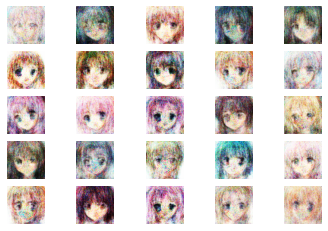

8601 [D loss: 0.079008, acc.: 96.88%] [G loss: 5.601325]
8602 [D loss: 0.076673, acc.: 96.88%] [G loss: 5.022108]
8603 [D loss: 0.034966, acc.: 100.00%] [G loss: 5.333119]
8604 [D loss: 0.116986, acc.: 96.88%] [G loss: 4.595726]
8605 [D loss: 0.051860, acc.: 98.44%] [G loss: 5.254522]
8606 [D loss: 0.041637, acc.: 100.00%] [G loss: 5.771295]
8607 [D loss: 0.086535, acc.: 95.31%] [G loss: 5.112352]
8608 [D loss: 0.106541, acc.: 95.31%] [G loss: 4.466477]
8609 [D loss: 0.166228, acc.: 93.75%] [G loss: 5.444300]
8610 [D loss: 0.159837, acc.: 96.88%] [G loss: 5.775589]
8611 [D loss: 0.127845, acc.: 96.88%] [G loss: 5.348027]
8612 [D loss: 0.128361, acc.: 96.88%] [G loss: 5.507854]
8613 [D loss: 0.092615, acc.: 96.88%] [G loss: 5.270497]
8614 [D loss: 0.060652, acc.: 98.44%] [G loss: 5.533336]
8615 [D loss: 0.100609, acc.: 96.88%] [G loss: 4.696946]
8616 [D loss: 0.051674, acc.: 98.44%] [G loss: 5.147734]
8617 [D loss: 0.121555, acc.: 95.31%] [G loss: 4.661154]
8618 [D loss: 0.106675, acc.:

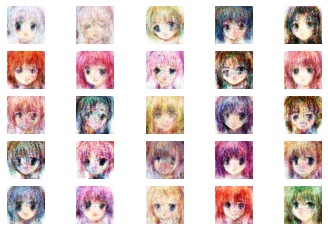

8801 [D loss: 0.078542, acc.: 96.88%] [G loss: 6.190427]
8802 [D loss: 0.046667, acc.: 98.44%] [G loss: 5.429358]
8803 [D loss: 0.102062, acc.: 96.88%] [G loss: 5.330216]
8804 [D loss: 0.112660, acc.: 95.31%] [G loss: 5.421945]
8805 [D loss: 0.110109, acc.: 95.31%] [G loss: 4.715193]
8806 [D loss: 0.104776, acc.: 96.88%] [G loss: 4.978124]
8807 [D loss: 0.191571, acc.: 92.19%] [G loss: 5.365141]
8808 [D loss: 0.019872, acc.: 100.00%] [G loss: 5.312963]
8809 [D loss: 0.057594, acc.: 98.44%] [G loss: 5.160305]
8810 [D loss: 0.184649, acc.: 93.75%] [G loss: 5.110045]
8811 [D loss: 0.035170, acc.: 98.44%] [G loss: 4.925168]
8812 [D loss: 0.082232, acc.: 93.75%] [G loss: 5.283867]
8813 [D loss: 0.097342, acc.: 96.88%] [G loss: 5.559927]
8814 [D loss: 0.095549, acc.: 96.88%] [G loss: 4.735410]
8815 [D loss: 0.108412, acc.: 96.88%] [G loss: 4.878098]
8816 [D loss: 0.084254, acc.: 96.88%] [G loss: 5.495022]
8817 [D loss: 0.069699, acc.: 98.44%] [G loss: 5.542201]
8818 [D loss: 0.030731, acc.: 

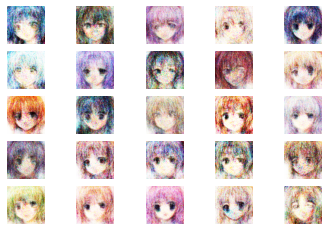

9001 [D loss: 0.152097, acc.: 95.31%] [G loss: 5.077575]
9002 [D loss: 0.159250, acc.: 93.75%] [G loss: 5.589056]
9003 [D loss: 0.221538, acc.: 93.75%] [G loss: 5.337165]
9004 [D loss: 0.039338, acc.: 100.00%] [G loss: 5.542075]
9005 [D loss: 0.225175, acc.: 90.62%] [G loss: 4.867620]
9006 [D loss: 0.038234, acc.: 100.00%] [G loss: 5.494156]
9007 [D loss: 0.075612, acc.: 96.88%] [G loss: 5.320212]
9008 [D loss: 0.125056, acc.: 96.88%] [G loss: 5.574379]
9009 [D loss: 0.141268, acc.: 93.75%] [G loss: 5.098706]
9010 [D loss: 0.102879, acc.: 96.88%] [G loss: 5.881264]
9011 [D loss: 0.159546, acc.: 95.31%] [G loss: 4.959391]
9012 [D loss: 0.138088, acc.: 96.88%] [G loss: 5.536878]
9013 [D loss: 0.045892, acc.: 98.44%] [G loss: 5.001911]
9014 [D loss: 0.093586, acc.: 95.31%] [G loss: 4.726596]
9015 [D loss: 0.079194, acc.: 96.88%] [G loss: 4.938872]
9016 [D loss: 0.057225, acc.: 96.88%] [G loss: 5.896924]
9017 [D loss: 0.143571, acc.: 98.44%] [G loss: 4.890976]
9018 [D loss: 0.044589, acc.:

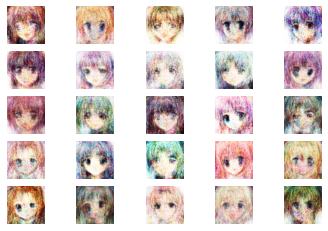

9201 [D loss: 0.100619, acc.: 95.31%] [G loss: 5.953062]
9202 [D loss: 0.291293, acc.: 90.62%] [G loss: 6.324272]
9203 [D loss: 0.167930, acc.: 95.31%] [G loss: 6.434122]
9204 [D loss: 0.128864, acc.: 92.19%] [G loss: 5.765835]
9205 [D loss: 0.187262, acc.: 93.75%] [G loss: 5.741599]
9206 [D loss: 0.129268, acc.: 95.31%] [G loss: 6.046207]
9207 [D loss: 0.087572, acc.: 96.88%] [G loss: 6.190013]
9208 [D loss: 0.065016, acc.: 98.44%] [G loss: 6.395109]
9209 [D loss: 0.036789, acc.: 98.44%] [G loss: 5.859396]
9210 [D loss: 0.171615, acc.: 90.62%] [G loss: 4.803470]
9211 [D loss: 0.045866, acc.: 98.44%] [G loss: 5.831310]
9212 [D loss: 0.045741, acc.: 98.44%] [G loss: 6.028172]
9213 [D loss: 0.102094, acc.: 93.75%] [G loss: 5.624687]
9214 [D loss: 0.158336, acc.: 96.88%] [G loss: 5.413606]
9215 [D loss: 0.029775, acc.: 100.00%] [G loss: 5.794474]
9216 [D loss: 0.175695, acc.: 93.75%] [G loss: 4.966758]
9217 [D loss: 0.090619, acc.: 95.31%] [G loss: 5.682475]
9218 [D loss: 0.335650, acc.: 

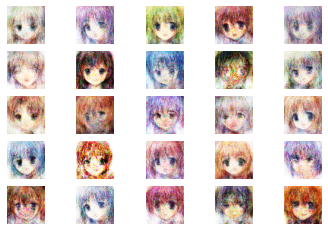

9401 [D loss: 0.032036, acc.: 100.00%] [G loss: 5.498794]
9402 [D loss: 0.192764, acc.: 92.19%] [G loss: 5.586092]
9403 [D loss: 0.061750, acc.: 95.31%] [G loss: 5.727253]
9404 [D loss: 0.063015, acc.: 96.88%] [G loss: 5.764242]
9405 [D loss: 0.114201, acc.: 96.88%] [G loss: 5.400815]
9406 [D loss: 0.064170, acc.: 95.31%] [G loss: 6.057160]
9407 [D loss: 0.065077, acc.: 100.00%] [G loss: 4.865661]
9408 [D loss: 0.124446, acc.: 95.31%] [G loss: 5.248142]
9409 [D loss: 0.030424, acc.: 100.00%] [G loss: 5.603551]
9410 [D loss: 0.153057, acc.: 95.31%] [G loss: 4.950915]
9411 [D loss: 0.050075, acc.: 98.44%] [G loss: 5.226457]
9412 [D loss: 0.032853, acc.: 100.00%] [G loss: 4.724198]
9413 [D loss: 0.048895, acc.: 96.88%] [G loss: 6.049119]
9414 [D loss: 0.108543, acc.: 96.88%] [G loss: 5.464762]
9415 [D loss: 0.141470, acc.: 96.88%] [G loss: 5.706401]
9416 [D loss: 0.102466, acc.: 95.31%] [G loss: 5.193991]
9417 [D loss: 0.056365, acc.: 98.44%] [G loss: 5.203236]
9418 [D loss: 0.024381, acc

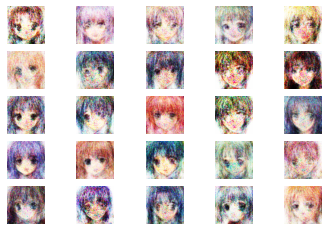

9601 [D loss: 0.066362, acc.: 96.88%] [G loss: 5.127748]
9602 [D loss: 0.034878, acc.: 98.44%] [G loss: 5.254440]
9603 [D loss: 0.116877, acc.: 95.31%] [G loss: 5.122626]
9604 [D loss: 0.036908, acc.: 98.44%] [G loss: 4.916554]
9605 [D loss: 0.111946, acc.: 93.75%] [G loss: 4.680970]
9606 [D loss: 0.055054, acc.: 98.44%] [G loss: 5.353013]
9607 [D loss: 0.075692, acc.: 96.88%] [G loss: 5.359202]
9608 [D loss: 0.042494, acc.: 98.44%] [G loss: 5.475793]
9609 [D loss: 0.078319, acc.: 96.88%] [G loss: 5.419397]
9610 [D loss: 0.066850, acc.: 98.44%] [G loss: 5.335531]
9611 [D loss: 0.050352, acc.: 100.00%] [G loss: 5.276958]
9612 [D loss: 0.061945, acc.: 96.88%] [G loss: 6.137148]
9613 [D loss: 0.051355, acc.: 96.88%] [G loss: 5.981973]
9614 [D loss: 0.081252, acc.: 96.88%] [G loss: 6.223778]
9615 [D loss: 0.093222, acc.: 93.75%] [G loss: 5.904738]
9616 [D loss: 0.037639, acc.: 100.00%] [G loss: 5.583907]
9617 [D loss: 0.054334, acc.: 96.88%] [G loss: 5.284171]
9618 [D loss: 0.409012, acc.:

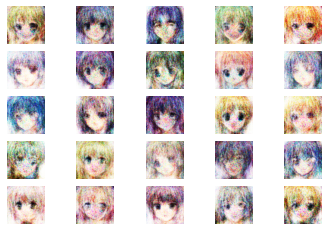

9801 [D loss: 0.099937, acc.: 96.88%] [G loss: 5.028926]
9802 [D loss: 0.130737, acc.: 90.62%] [G loss: 5.849654]
9803 [D loss: 0.140275, acc.: 96.88%] [G loss: 6.435434]
9804 [D loss: 0.052133, acc.: 98.44%] [G loss: 5.990650]
9805 [D loss: 0.064451, acc.: 98.44%] [G loss: 5.986403]
9806 [D loss: 0.115212, acc.: 95.31%] [G loss: 5.365033]
9807 [D loss: 0.064580, acc.: 98.44%] [G loss: 5.595418]
9808 [D loss: 0.068108, acc.: 96.88%] [G loss: 5.126433]
9809 [D loss: 0.089408, acc.: 96.88%] [G loss: 5.413074]
9810 [D loss: 0.166726, acc.: 95.31%] [G loss: 5.386202]
9811 [D loss: 0.166582, acc.: 93.75%] [G loss: 5.721485]
9812 [D loss: 0.060011, acc.: 98.44%] [G loss: 5.542555]
9813 [D loss: 0.043548, acc.: 96.88%] [G loss: 6.292120]
9814 [D loss: 0.142355, acc.: 93.75%] [G loss: 4.215339]
9815 [D loss: 0.080729, acc.: 96.88%] [G loss: 4.925537]
9816 [D loss: 0.148627, acc.: 92.19%] [G loss: 5.568903]
9817 [D loss: 0.101140, acc.: 98.44%] [G loss: 5.417354]
9818 [D loss: 0.075689, acc.: 9

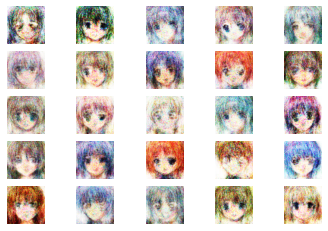

10001 [D loss: 0.108463, acc.: 98.44%] [G loss: 5.571226]
10002 [D loss: 0.186511, acc.: 92.19%] [G loss: 5.334846]
10003 [D loss: 0.122824, acc.: 93.75%] [G loss: 5.330798]
10004 [D loss: 0.121924, acc.: 96.88%] [G loss: 6.026393]
10005 [D loss: 0.039730, acc.: 98.44%] [G loss: 5.932511]
10006 [D loss: 0.094376, acc.: 95.31%] [G loss: 5.447799]
10007 [D loss: 0.041409, acc.: 98.44%] [G loss: 6.546102]
10008 [D loss: 0.037756, acc.: 98.44%] [G loss: 5.430421]
10009 [D loss: 0.047393, acc.: 98.44%] [G loss: 5.280644]
10010 [D loss: 0.080261, acc.: 96.88%] [G loss: 5.647417]
10011 [D loss: 0.046919, acc.: 98.44%] [G loss: 5.389567]
10012 [D loss: 0.249329, acc.: 90.62%] [G loss: 6.174598]
10013 [D loss: 0.053954, acc.: 96.88%] [G loss: 6.533821]
10014 [D loss: 0.255422, acc.: 92.19%] [G loss: 5.278542]
10015 [D loss: 0.486605, acc.: 82.81%] [G loss: 5.208523]
10016 [D loss: 0.149935, acc.: 95.31%] [G loss: 5.632136]
10017 [D loss: 0.117762, acc.: 92.19%] [G loss: 5.779852]
10018 [D loss:

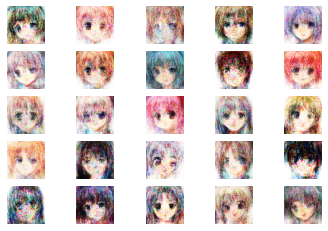

10201 [D loss: 0.169801, acc.: 93.75%] [G loss: 5.813183]
10202 [D loss: 0.128798, acc.: 93.75%] [G loss: 5.390218]
10203 [D loss: 0.024258, acc.: 100.00%] [G loss: 5.460511]
10204 [D loss: 0.079708, acc.: 96.88%] [G loss: 5.404180]
10205 [D loss: 0.035700, acc.: 98.44%] [G loss: 4.638831]
10206 [D loss: 0.027015, acc.: 100.00%] [G loss: 5.184446]
10207 [D loss: 0.157482, acc.: 95.31%] [G loss: 5.210270]
10208 [D loss: 0.057123, acc.: 96.88%] [G loss: 5.265326]
10209 [D loss: 0.072989, acc.: 96.88%] [G loss: 5.955393]
10210 [D loss: 0.052314, acc.: 96.88%] [G loss: 6.361008]
10211 [D loss: 0.096241, acc.: 95.31%] [G loss: 5.612753]
10212 [D loss: 0.122227, acc.: 96.88%] [G loss: 6.221070]
10213 [D loss: 0.049786, acc.: 96.88%] [G loss: 5.764331]
10214 [D loss: 0.085338, acc.: 96.88%] [G loss: 4.752503]
10215 [D loss: 0.124567, acc.: 98.44%] [G loss: 5.410392]
10216 [D loss: 0.173275, acc.: 93.75%] [G loss: 5.604306]
10217 [D loss: 0.156922, acc.: 93.75%] [G loss: 4.865529]
10218 [D los

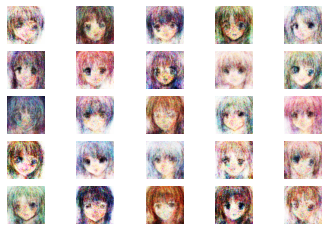

10401 [D loss: 0.128690, acc.: 95.31%] [G loss: 6.006026]
10402 [D loss: 0.084741, acc.: 96.88%] [G loss: 5.346543]
10403 [D loss: 0.028783, acc.: 100.00%] [G loss: 5.160303]
10404 [D loss: 0.144349, acc.: 93.75%] [G loss: 6.406216]
10405 [D loss: 0.132235, acc.: 96.88%] [G loss: 6.545542]
10406 [D loss: 0.204933, acc.: 92.19%] [G loss: 5.670979]
10407 [D loss: 0.089263, acc.: 95.31%] [G loss: 6.160100]
10408 [D loss: 0.166681, acc.: 93.75%] [G loss: 5.231545]
10409 [D loss: 0.125929, acc.: 95.31%] [G loss: 5.188753]
10410 [D loss: 0.115166, acc.: 93.75%] [G loss: 4.556052]
10411 [D loss: 0.217390, acc.: 93.75%] [G loss: 5.831706]
10412 [D loss: 0.093553, acc.: 96.88%] [G loss: 5.446308]
10413 [D loss: 0.083175, acc.: 96.88%] [G loss: 6.053103]
10414 [D loss: 0.125569, acc.: 93.75%] [G loss: 5.574389]
10415 [D loss: 0.039091, acc.: 98.44%] [G loss: 5.632416]
10416 [D loss: 0.226236, acc.: 93.75%] [G loss: 5.581991]
10417 [D loss: 0.043241, acc.: 98.44%] [G loss: 6.263554]
10418 [D loss

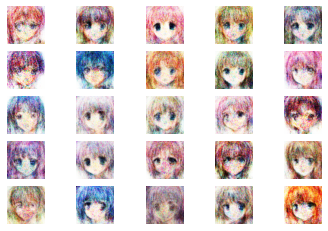

10601 [D loss: 0.078899, acc.: 95.31%] [G loss: 5.955939]
10602 [D loss: 0.069406, acc.: 98.44%] [G loss: 6.582314]
10603 [D loss: 0.111695, acc.: 95.31%] [G loss: 5.172149]
10604 [D loss: 0.071648, acc.: 96.88%] [G loss: 5.295156]
10605 [D loss: 0.304930, acc.: 87.50%] [G loss: 6.387169]
10606 [D loss: 0.111963, acc.: 95.31%] [G loss: 6.774058]
10607 [D loss: 0.094531, acc.: 98.44%] [G loss: 5.566913]
10608 [D loss: 0.078989, acc.: 98.44%] [G loss: 5.557796]
10609 [D loss: 0.140817, acc.: 92.19%] [G loss: 5.858543]
10610 [D loss: 0.172082, acc.: 93.75%] [G loss: 5.799474]
10611 [D loss: 0.087682, acc.: 95.31%] [G loss: 5.634775]
10612 [D loss: 0.144742, acc.: 93.75%] [G loss: 5.722222]
10613 [D loss: 0.104274, acc.: 93.75%] [G loss: 5.798709]
10614 [D loss: 0.144781, acc.: 92.19%] [G loss: 4.587891]
10615 [D loss: 0.139275, acc.: 93.75%] [G loss: 5.616163]
10616 [D loss: 0.027033, acc.: 100.00%] [G loss: 5.642487]
10617 [D loss: 0.295315, acc.: 89.06%] [G loss: 6.659884]
10618 [D loss

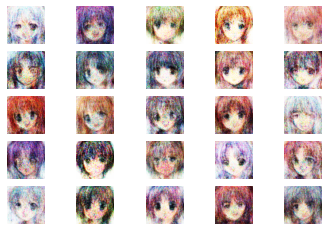

10801 [D loss: 0.151536, acc.: 93.75%] [G loss: 5.779274]
10802 [D loss: 0.247316, acc.: 92.19%] [G loss: 6.409412]
10803 [D loss: 0.091307, acc.: 96.88%] [G loss: 6.406426]
10804 [D loss: 0.135409, acc.: 92.19%] [G loss: 5.653655]
10805 [D loss: 0.139092, acc.: 95.31%] [G loss: 5.520227]
10806 [D loss: 0.072587, acc.: 96.88%] [G loss: 6.024804]
10807 [D loss: 0.050754, acc.: 100.00%] [G loss: 6.254313]
10808 [D loss: 0.071410, acc.: 98.44%] [G loss: 5.938995]
10809 [D loss: 0.073962, acc.: 98.44%] [G loss: 6.212176]
10810 [D loss: 0.022014, acc.: 100.00%] [G loss: 5.864641]
10811 [D loss: 0.013546, acc.: 100.00%] [G loss: 5.708813]
10812 [D loss: 0.066291, acc.: 96.88%] [G loss: 5.994572]
10813 [D loss: 0.068269, acc.: 98.44%] [G loss: 6.422746]
10814 [D loss: 0.179272, acc.: 95.31%] [G loss: 6.134997]
10815 [D loss: 0.122077, acc.: 92.19%] [G loss: 6.480225]
10816 [D loss: 0.166127, acc.: 93.75%] [G loss: 5.163603]
10817 [D loss: 0.113717, acc.: 96.88%] [G loss: 6.155011]
10818 [D lo

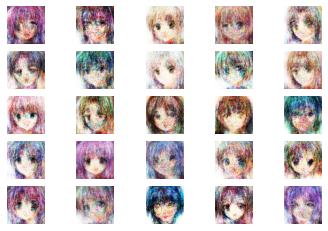

11001 [D loss: 0.052803, acc.: 98.44%] [G loss: 6.066363]
11002 [D loss: 0.119018, acc.: 95.31%] [G loss: 5.249743]
11003 [D loss: 0.056986, acc.: 98.44%] [G loss: 5.054079]
11004 [D loss: 0.172484, acc.: 92.19%] [G loss: 5.140574]
11005 [D loss: 0.105254, acc.: 95.31%] [G loss: 4.945042]
11006 [D loss: 0.024606, acc.: 100.00%] [G loss: 6.491117]
11007 [D loss: 0.033959, acc.: 98.44%] [G loss: 6.049303]
11008 [D loss: 0.036443, acc.: 98.44%] [G loss: 6.487146]
11009 [D loss: 0.120199, acc.: 96.88%] [G loss: 6.099071]
11010 [D loss: 0.074410, acc.: 98.44%] [G loss: 6.281610]
11011 [D loss: 0.149809, acc.: 95.31%] [G loss: 4.956334]
11012 [D loss: 0.162205, acc.: 95.31%] [G loss: 4.334771]
11013 [D loss: 0.103751, acc.: 96.88%] [G loss: 5.730536]
11014 [D loss: 0.074822, acc.: 96.88%] [G loss: 5.723998]
11015 [D loss: 0.029343, acc.: 98.44%] [G loss: 5.603350]
11016 [D loss: 0.367287, acc.: 85.94%] [G loss: 4.973008]
11017 [D loss: 0.141806, acc.: 92.19%] [G loss: 5.971703]
11018 [D loss

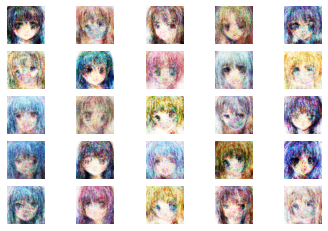

11201 [D loss: 0.154292, acc.: 92.19%] [G loss: 6.119762]
11202 [D loss: 0.047684, acc.: 98.44%] [G loss: 6.072197]
11203 [D loss: 0.196459, acc.: 95.31%] [G loss: 5.609423]
11204 [D loss: 0.102563, acc.: 96.88%] [G loss: 6.770900]
11205 [D loss: 0.085067, acc.: 95.31%] [G loss: 6.050946]
11206 [D loss: 0.118554, acc.: 95.31%] [G loss: 5.129734]
11207 [D loss: 0.100949, acc.: 95.31%] [G loss: 4.778209]
11208 [D loss: 0.056083, acc.: 98.44%] [G loss: 6.387867]
11209 [D loss: 0.096266, acc.: 96.88%] [G loss: 5.236300]
11210 [D loss: 0.092349, acc.: 95.31%] [G loss: 6.111520]
11211 [D loss: 0.084937, acc.: 98.44%] [G loss: 5.484718]
11212 [D loss: 0.196630, acc.: 92.19%] [G loss: 5.978303]
11213 [D loss: 0.135897, acc.: 92.19%] [G loss: 5.843026]
11214 [D loss: 0.118087, acc.: 95.31%] [G loss: 6.426524]
11215 [D loss: 0.121188, acc.: 95.31%] [G loss: 6.680598]
11216 [D loss: 0.120169, acc.: 98.44%] [G loss: 6.557623]
11217 [D loss: 0.119308, acc.: 95.31%] [G loss: 6.837860]
11218 [D loss:

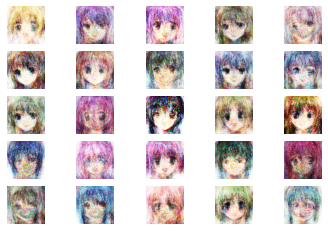

11401 [D loss: 0.044683, acc.: 98.44%] [G loss: 5.836165]
11402 [D loss: 0.051841, acc.: 98.44%] [G loss: 5.795732]
11403 [D loss: 0.022345, acc.: 100.00%] [G loss: 6.055845]
11404 [D loss: 0.093267, acc.: 95.31%] [G loss: 5.633974]
11405 [D loss: 0.053576, acc.: 95.31%] [G loss: 5.441488]
11406 [D loss: 0.076969, acc.: 96.88%] [G loss: 5.232880]
11407 [D loss: 0.039564, acc.: 100.00%] [G loss: 5.499934]
11408 [D loss: 0.167802, acc.: 93.75%] [G loss: 5.335753]
11409 [D loss: 0.052572, acc.: 95.31%] [G loss: 6.054206]
11410 [D loss: 0.074687, acc.: 96.88%] [G loss: 6.162249]
11411 [D loss: 0.021670, acc.: 100.00%] [G loss: 6.342481]
11412 [D loss: 0.148147, acc.: 93.75%] [G loss: 5.838298]
11413 [D loss: 0.031296, acc.: 98.44%] [G loss: 5.649297]
11414 [D loss: 0.118973, acc.: 93.75%] [G loss: 4.731459]
11415 [D loss: 0.097732, acc.: 95.31%] [G loss: 5.356322]
11416 [D loss: 0.062289, acc.: 98.44%] [G loss: 5.779310]
11417 [D loss: 0.200366, acc.: 96.88%] [G loss: 6.053252]
11418 [D lo

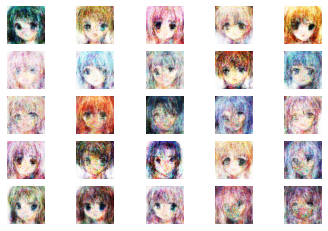

11601 [D loss: 0.176088, acc.: 95.31%] [G loss: 5.254034]
11602 [D loss: 0.162126, acc.: 95.31%] [G loss: 5.609691]
11603 [D loss: 0.152784, acc.: 92.19%] [G loss: 7.308470]
11604 [D loss: 0.082000, acc.: 95.31%] [G loss: 5.842308]
11605 [D loss: 0.023558, acc.: 100.00%] [G loss: 6.581229]
11606 [D loss: 0.042127, acc.: 100.00%] [G loss: 5.593874]
11607 [D loss: 0.048833, acc.: 98.44%] [G loss: 5.326838]
11608 [D loss: 0.122122, acc.: 95.31%] [G loss: 5.417719]
11609 [D loss: 0.090119, acc.: 98.44%] [G loss: 5.467510]
11610 [D loss: 0.039370, acc.: 100.00%] [G loss: 6.198875]
11611 [D loss: 0.047771, acc.: 98.44%] [G loss: 5.570705]
11612 [D loss: 0.037007, acc.: 98.44%] [G loss: 5.655318]
11613 [D loss: 0.088064, acc.: 96.88%] [G loss: 6.091973]
11614 [D loss: 0.150040, acc.: 93.75%] [G loss: 6.400667]
11615 [D loss: 0.109328, acc.: 96.88%] [G loss: 6.335218]
11616 [D loss: 0.021640, acc.: 100.00%] [G loss: 5.905356]
11617 [D loss: 0.043380, acc.: 100.00%] [G loss: 5.667658]
11618 [D 

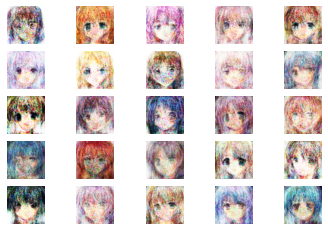

11801 [D loss: 0.119458, acc.: 93.75%] [G loss: 6.499552]
11802 [D loss: 0.043463, acc.: 98.44%] [G loss: 6.259385]
11803 [D loss: 0.131567, acc.: 93.75%] [G loss: 5.623566]
11804 [D loss: 0.129931, acc.: 93.75%] [G loss: 5.463086]
11805 [D loss: 0.049866, acc.: 98.44%] [G loss: 6.317152]
11806 [D loss: 0.036057, acc.: 98.44%] [G loss: 6.144093]
11807 [D loss: 0.054058, acc.: 96.88%] [G loss: 6.095575]
11808 [D loss: 0.150651, acc.: 93.75%] [G loss: 6.332320]
11809 [D loss: 0.182162, acc.: 92.19%] [G loss: 5.945872]
11810 [D loss: 0.344564, acc.: 85.94%] [G loss: 5.119169]
11811 [D loss: 0.143419, acc.: 92.19%] [G loss: 6.196999]
11812 [D loss: 0.057062, acc.: 96.88%] [G loss: 6.148929]
11813 [D loss: 0.084431, acc.: 96.88%] [G loss: 5.791922]
11814 [D loss: 0.021998, acc.: 100.00%] [G loss: 5.743001]
11815 [D loss: 0.174183, acc.: 92.19%] [G loss: 5.687524]
11816 [D loss: 0.124838, acc.: 93.75%] [G loss: 6.157112]
11817 [D loss: 0.178112, acc.: 93.75%] [G loss: 5.995593]
11818 [D loss

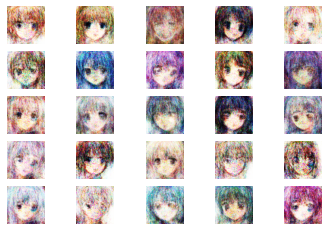

12001 [D loss: 0.038460, acc.: 98.44%] [G loss: 6.162346]
12002 [D loss: 0.100406, acc.: 93.75%] [G loss: 6.025428]
12003 [D loss: 0.023305, acc.: 100.00%] [G loss: 6.119724]
12004 [D loss: 0.045469, acc.: 100.00%] [G loss: 7.016357]
12005 [D loss: 0.042140, acc.: 96.88%] [G loss: 5.168378]
12006 [D loss: 0.086560, acc.: 96.88%] [G loss: 5.025805]
12007 [D loss: 0.256433, acc.: 93.75%] [G loss: 6.697517]
12008 [D loss: 0.062599, acc.: 98.44%] [G loss: 6.254100]
12009 [D loss: 0.244932, acc.: 90.62%] [G loss: 5.400726]
12010 [D loss: 0.201947, acc.: 92.19%] [G loss: 5.615081]
12011 [D loss: 0.035592, acc.: 100.00%] [G loss: 5.998818]
12012 [D loss: 0.083797, acc.: 96.88%] [G loss: 5.256498]
12013 [D loss: 0.023611, acc.: 100.00%] [G loss: 6.039115]
12014 [D loss: 0.104682, acc.: 93.75%] [G loss: 5.464937]
12015 [D loss: 0.166328, acc.: 95.31%] [G loss: 6.158263]
12016 [D loss: 0.042621, acc.: 96.88%] [G loss: 6.130167]
12017 [D loss: 0.060886, acc.: 96.88%] [G loss: 5.252719]
12018 [D l

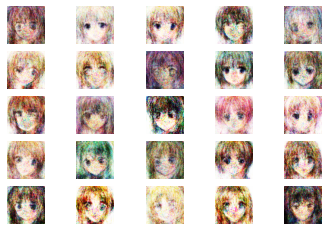

12201 [D loss: 0.074022, acc.: 95.31%] [G loss: 4.978051]
12202 [D loss: 0.346786, acc.: 92.19%] [G loss: 6.750130]
12203 [D loss: 0.214250, acc.: 92.19%] [G loss: 5.713023]
12204 [D loss: 0.059969, acc.: 98.44%] [G loss: 6.747629]
12205 [D loss: 0.109247, acc.: 95.31%] [G loss: 5.870647]
12206 [D loss: 0.169879, acc.: 92.19%] [G loss: 6.417584]
12207 [D loss: 0.135173, acc.: 95.31%] [G loss: 6.660133]
12208 [D loss: 0.152789, acc.: 93.75%] [G loss: 6.684320]
12209 [D loss: 0.095470, acc.: 96.88%] [G loss: 5.852988]
12210 [D loss: 0.213927, acc.: 96.88%] [G loss: 5.322591]
12211 [D loss: 0.133003, acc.: 95.31%] [G loss: 5.474068]
12212 [D loss: 0.246996, acc.: 93.75%] [G loss: 6.185126]
12213 [D loss: 0.111394, acc.: 96.88%] [G loss: 6.017612]
12214 [D loss: 0.037436, acc.: 98.44%] [G loss: 5.436407]
12215 [D loss: 0.078741, acc.: 95.31%] [G loss: 6.319670]
12216 [D loss: 0.109270, acc.: 96.88%] [G loss: 6.304916]
12217 [D loss: 0.079709, acc.: 96.88%] [G loss: 6.060905]
12218 [D loss:

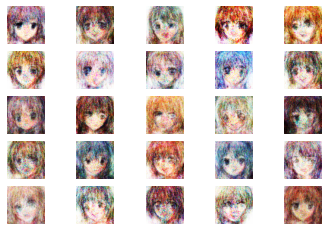

12401 [D loss: 0.027250, acc.: 98.44%] [G loss: 6.446322]
12402 [D loss: 0.053875, acc.: 98.44%] [G loss: 5.922027]
12403 [D loss: 0.062584, acc.: 98.44%] [G loss: 6.829001]
12404 [D loss: 0.104429, acc.: 96.88%] [G loss: 6.653907]
12405 [D loss: 0.159150, acc.: 93.75%] [G loss: 5.807766]
12406 [D loss: 0.048313, acc.: 98.44%] [G loss: 5.960507]
12407 [D loss: 0.091399, acc.: 95.31%] [G loss: 5.921050]
12408 [D loss: 0.126434, acc.: 96.88%] [G loss: 6.209635]
12409 [D loss: 0.058771, acc.: 98.44%] [G loss: 6.061364]
12410 [D loss: 0.189520, acc.: 93.75%] [G loss: 5.276324]
12411 [D loss: 0.041932, acc.: 100.00%] [G loss: 5.742259]
12412 [D loss: 0.308129, acc.: 89.06%] [G loss: 6.933777]
12413 [D loss: 0.072459, acc.: 96.88%] [G loss: 6.547684]
12414 [D loss: 0.174050, acc.: 93.75%] [G loss: 5.794903]
12415 [D loss: 0.042478, acc.: 98.44%] [G loss: 6.382412]
12416 [D loss: 0.122568, acc.: 96.88%] [G loss: 4.564690]
12417 [D loss: 0.029595, acc.: 100.00%] [G loss: 5.128151]
12418 [D los

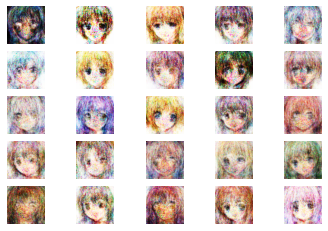

12601 [D loss: 0.036116, acc.: 98.44%] [G loss: 5.246525]
12602 [D loss: 0.093592, acc.: 96.88%] [G loss: 6.344883]
12603 [D loss: 0.124215, acc.: 96.88%] [G loss: 5.484822]
12604 [D loss: 0.067828, acc.: 96.88%] [G loss: 6.301190]
12605 [D loss: 0.018622, acc.: 100.00%] [G loss: 6.334437]
12606 [D loss: 0.086176, acc.: 96.88%] [G loss: 6.015860]
12607 [D loss: 0.041153, acc.: 98.44%] [G loss: 6.008806]
12608 [D loss: 0.075281, acc.: 95.31%] [G loss: 6.221092]
12609 [D loss: 0.045975, acc.: 100.00%] [G loss: 5.472239]
12610 [D loss: 0.217737, acc.: 90.62%] [G loss: 5.928628]
12611 [D loss: 0.034453, acc.: 100.00%] [G loss: 6.943629]
12612 [D loss: 0.031308, acc.: 98.44%] [G loss: 5.335500]
12613 [D loss: 0.247106, acc.: 92.19%] [G loss: 5.067057]
12614 [D loss: 0.153559, acc.: 92.19%] [G loss: 5.800781]
12615 [D loss: 0.207990, acc.: 95.31%] [G loss: 5.909991]
12616 [D loss: 0.016230, acc.: 100.00%] [G loss: 6.130938]
12617 [D loss: 0.112386, acc.: 95.31%] [G loss: 5.734135]
12618 [D l

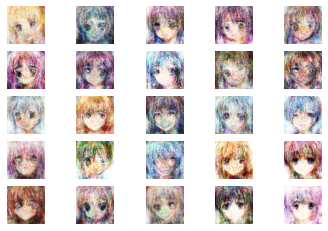

12801 [D loss: 0.043147, acc.: 98.44%] [G loss: 6.583085]
12802 [D loss: 0.108416, acc.: 95.31%] [G loss: 6.308791]
12803 [D loss: 0.079413, acc.: 98.44%] [G loss: 6.272686]
12804 [D loss: 0.033606, acc.: 98.44%] [G loss: 6.094175]
12805 [D loss: 0.060654, acc.: 96.88%] [G loss: 6.493298]
12806 [D loss: 0.179434, acc.: 95.31%] [G loss: 6.586792]
12807 [D loss: 0.026862, acc.: 100.00%] [G loss: 5.935544]
12808 [D loss: 0.118549, acc.: 98.44%] [G loss: 5.663467]
12809 [D loss: 0.098899, acc.: 95.31%] [G loss: 6.171650]
12810 [D loss: 0.039052, acc.: 100.00%] [G loss: 6.038171]
12811 [D loss: 0.023444, acc.: 100.00%] [G loss: 6.265396]
12812 [D loss: 0.167939, acc.: 92.19%] [G loss: 6.227325]
12813 [D loss: 0.110749, acc.: 96.88%] [G loss: 6.117057]
12814 [D loss: 0.303605, acc.: 89.06%] [G loss: 6.468513]
12815 [D loss: 0.037519, acc.: 100.00%] [G loss: 6.087757]
12816 [D loss: 0.089861, acc.: 98.44%] [G loss: 6.299665]
12817 [D loss: 0.044464, acc.: 98.44%] [G loss: 6.123679]
12818 [D l

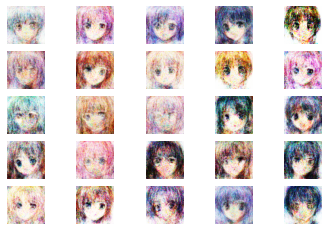

13001 [D loss: 0.028123, acc.: 100.00%] [G loss: 6.297820]
13002 [D loss: 0.054790, acc.: 98.44%] [G loss: 5.983180]
13003 [D loss: 0.037894, acc.: 98.44%] [G loss: 5.617692]
13004 [D loss: 0.086154, acc.: 98.44%] [G loss: 6.236682]
13005 [D loss: 0.215539, acc.: 95.31%] [G loss: 5.436666]
13006 [D loss: 0.103464, acc.: 95.31%] [G loss: 5.416781]
13007 [D loss: 0.149847, acc.: 93.75%] [G loss: 5.777289]
13008 [D loss: 0.027193, acc.: 100.00%] [G loss: 6.128318]
13009 [D loss: 0.018228, acc.: 100.00%] [G loss: 5.641489]
13010 [D loss: 0.020106, acc.: 100.00%] [G loss: 6.355069]
13011 [D loss: 0.108916, acc.: 96.88%] [G loss: 5.218081]
13012 [D loss: 0.037935, acc.: 98.44%] [G loss: 5.446994]
13013 [D loss: 0.012086, acc.: 100.00%] [G loss: 5.954925]
13014 [D loss: 0.025281, acc.: 100.00%] [G loss: 5.968154]
13015 [D loss: 0.128228, acc.: 95.31%] [G loss: 5.252506]
13016 [D loss: 0.046080, acc.: 98.44%] [G loss: 4.707379]
13017 [D loss: 0.088807, acc.: 96.88%] [G loss: 5.926062]
13018 [D

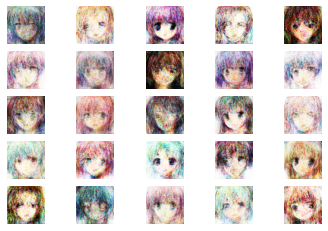

13201 [D loss: 0.175665, acc.: 93.75%] [G loss: 4.311208]
13202 [D loss: 0.039394, acc.: 98.44%] [G loss: 5.420444]
13203 [D loss: 0.165911, acc.: 95.31%] [G loss: 6.319809]
13204 [D loss: 0.040615, acc.: 96.88%] [G loss: 5.466183]
13205 [D loss: 0.045977, acc.: 98.44%] [G loss: 6.077376]
13206 [D loss: 0.173053, acc.: 95.31%] [G loss: 6.142850]
13207 [D loss: 0.068788, acc.: 96.88%] [G loss: 5.421776]
13208 [D loss: 0.050845, acc.: 98.44%] [G loss: 6.052938]
13209 [D loss: 0.122987, acc.: 95.31%] [G loss: 5.506901]
13210 [D loss: 0.137459, acc.: 93.75%] [G loss: 6.051826]
13211 [D loss: 0.025886, acc.: 98.44%] [G loss: 6.578692]
13212 [D loss: 0.097122, acc.: 96.88%] [G loss: 7.003121]
13213 [D loss: 0.124791, acc.: 92.19%] [G loss: 5.272451]
13214 [D loss: 0.023248, acc.: 100.00%] [G loss: 5.767960]
13215 [D loss: 0.022750, acc.: 100.00%] [G loss: 5.558923]
13216 [D loss: 0.084504, acc.: 96.88%] [G loss: 5.838811]
13217 [D loss: 0.026047, acc.: 100.00%] [G loss: 5.716938]
13218 [D lo

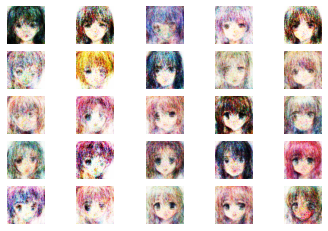

13401 [D loss: 0.184650, acc.: 95.31%] [G loss: 6.087781]
13402 [D loss: 0.026097, acc.: 98.44%] [G loss: 6.414111]
13403 [D loss: 0.157867, acc.: 96.88%] [G loss: 5.870014]
13404 [D loss: 0.064982, acc.: 98.44%] [G loss: 5.365737]
13405 [D loss: 0.207133, acc.: 90.62%] [G loss: 6.013986]
13406 [D loss: 0.163264, acc.: 92.19%] [G loss: 4.905735]
13407 [D loss: 0.086398, acc.: 98.44%] [G loss: 5.036087]
13408 [D loss: 0.061167, acc.: 96.88%] [G loss: 5.552113]
13409 [D loss: 0.062628, acc.: 98.44%] [G loss: 5.981634]
13410 [D loss: 0.151534, acc.: 96.88%] [G loss: 5.948225]
13411 [D loss: 0.216987, acc.: 90.62%] [G loss: 4.827016]
13412 [D loss: 0.135901, acc.: 95.31%] [G loss: 6.377500]
13413 [D loss: 0.185038, acc.: 93.75%] [G loss: 5.205981]
13414 [D loss: 0.058465, acc.: 98.44%] [G loss: 5.587708]
13415 [D loss: 0.083174, acc.: 98.44%] [G loss: 5.005999]
13416 [D loss: 0.048919, acc.: 98.44%] [G loss: 4.616257]
13417 [D loss: 0.038304, acc.: 98.44%] [G loss: 5.783000]
13418 [D loss:

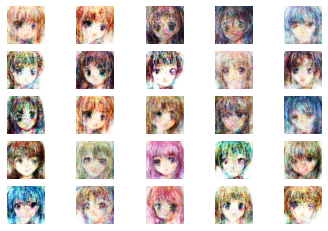

13601 [D loss: 0.108267, acc.: 96.88%] [G loss: 5.009024]
13602 [D loss: 0.093660, acc.: 95.31%] [G loss: 5.850830]
13603 [D loss: 0.218870, acc.: 92.19%] [G loss: 6.482695]
13604 [D loss: 0.009642, acc.: 100.00%] [G loss: 6.863841]
13605 [D loss: 0.079544, acc.: 98.44%] [G loss: 6.358933]
13606 [D loss: 0.060546, acc.: 96.88%] [G loss: 6.237111]
13607 [D loss: 0.078156, acc.: 96.88%] [G loss: 5.858497]
13608 [D loss: 0.062331, acc.: 96.88%] [G loss: 5.800715]
13609 [D loss: 0.078043, acc.: 98.44%] [G loss: 6.028006]
13610 [D loss: 0.114634, acc.: 95.31%] [G loss: 5.994653]
13611 [D loss: 0.213220, acc.: 90.62%] [G loss: 6.286304]
13612 [D loss: 0.070201, acc.: 98.44%] [G loss: 6.314998]
13613 [D loss: 0.170237, acc.: 93.75%] [G loss: 5.649731]
13614 [D loss: 0.046316, acc.: 98.44%] [G loss: 5.639813]
13615 [D loss: 0.218713, acc.: 93.75%] [G loss: 6.905012]
13616 [D loss: 0.058890, acc.: 98.44%] [G loss: 6.085064]
13617 [D loss: 0.080715, acc.: 98.44%] [G loss: 6.330001]
13618 [D loss

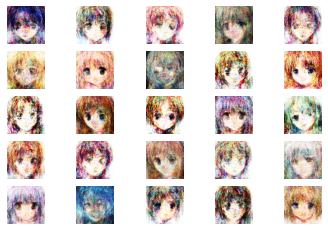

13801 [D loss: 0.081258, acc.: 98.44%] [G loss: 5.864132]
13802 [D loss: 0.033771, acc.: 100.00%] [G loss: 6.793516]
13803 [D loss: 0.161508, acc.: 93.75%] [G loss: 5.507408]
13804 [D loss: 0.113424, acc.: 98.44%] [G loss: 6.412447]
13805 [D loss: 0.085990, acc.: 93.75%] [G loss: 6.027747]
13806 [D loss: 0.100635, acc.: 95.31%] [G loss: 6.863931]
13807 [D loss: 0.020820, acc.: 100.00%] [G loss: 6.766231]
13808 [D loss: 0.193065, acc.: 92.19%] [G loss: 5.338170]
13809 [D loss: 0.200071, acc.: 93.75%] [G loss: 4.738201]
13810 [D loss: 0.070145, acc.: 96.88%] [G loss: 5.536448]
13811 [D loss: 0.087781, acc.: 98.44%] [G loss: 5.263633]
13812 [D loss: 0.082202, acc.: 96.88%] [G loss: 6.454803]
13813 [D loss: 0.020226, acc.: 100.00%] [G loss: 6.262892]
13814 [D loss: 0.071055, acc.: 98.44%] [G loss: 5.968056]
13815 [D loss: 0.162886, acc.: 93.75%] [G loss: 5.448817]
13816 [D loss: 0.054921, acc.: 98.44%] [G loss: 5.758676]
13817 [D loss: 0.076997, acc.: 96.88%] [G loss: 5.822080]
13818 [D lo

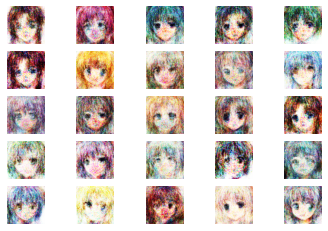

14001 [D loss: 0.063394, acc.: 95.31%] [G loss: 6.125395]
14002 [D loss: 0.088284, acc.: 96.88%] [G loss: 6.447753]
14003 [D loss: 0.032126, acc.: 98.44%] [G loss: 6.883632]
14004 [D loss: 0.197738, acc.: 92.19%] [G loss: 6.144544]
14005 [D loss: 0.060214, acc.: 98.44%] [G loss: 6.162407]
14006 [D loss: 0.045309, acc.: 98.44%] [G loss: 6.533813]
14007 [D loss: 0.104991, acc.: 93.75%] [G loss: 6.206829]
14008 [D loss: 0.252288, acc.: 90.62%] [G loss: 6.641298]
14009 [D loss: 0.047575, acc.: 98.44%] [G loss: 6.975436]
14010 [D loss: 0.231208, acc.: 90.62%] [G loss: 5.926936]
14011 [D loss: 0.134898, acc.: 93.75%] [G loss: 5.680941]
14012 [D loss: 0.012180, acc.: 100.00%] [G loss: 5.920781]
14013 [D loss: 0.051879, acc.: 98.44%] [G loss: 6.947135]
14014 [D loss: 0.473707, acc.: 87.50%] [G loss: 5.543775]
14015 [D loss: 0.184133, acc.: 93.75%] [G loss: 6.377002]
14016 [D loss: 0.014818, acc.: 100.00%] [G loss: 7.302000]
14017 [D loss: 0.166955, acc.: 93.75%] [G loss: 5.423982]
14018 [D los

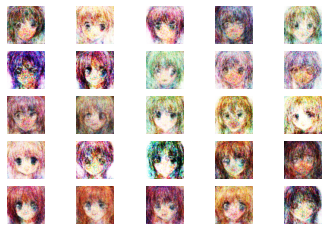

14201 [D loss: 0.230773, acc.: 92.19%] [G loss: 6.594130]
14202 [D loss: 0.035640, acc.: 98.44%] [G loss: 6.902626]
14203 [D loss: 0.073210, acc.: 96.88%] [G loss: 6.789347]
14204 [D loss: 0.075824, acc.: 98.44%] [G loss: 6.262255]
14205 [D loss: 0.064260, acc.: 98.44%] [G loss: 6.105491]
14206 [D loss: 0.033228, acc.: 100.00%] [G loss: 5.745349]
14207 [D loss: 0.097288, acc.: 96.88%] [G loss: 6.045771]
14208 [D loss: 0.049613, acc.: 100.00%] [G loss: 6.023310]
14209 [D loss: 0.028146, acc.: 98.44%] [G loss: 5.919572]
14210 [D loss: 0.182428, acc.: 93.75%] [G loss: 6.374724]
14211 [D loss: 0.072724, acc.: 98.44%] [G loss: 6.570457]
14212 [D loss: 0.019886, acc.: 100.00%] [G loss: 6.509845]
14213 [D loss: 0.042430, acc.: 98.44%] [G loss: 6.536403]
14214 [D loss: 0.020952, acc.: 100.00%] [G loss: 6.369568]
14215 [D loss: 0.016789, acc.: 100.00%] [G loss: 6.316110]
14216 [D loss: 0.039119, acc.: 100.00%] [G loss: 6.487161]
14217 [D loss: 0.103104, acc.: 95.31%] [G loss: 6.031085]
14218 [D

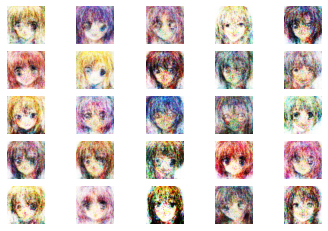

14401 [D loss: 0.019606, acc.: 100.00%] [G loss: 6.010827]
14402 [D loss: 0.066731, acc.: 98.44%] [G loss: 6.125238]
14403 [D loss: 0.040429, acc.: 98.44%] [G loss: 5.898314]
14404 [D loss: 0.019462, acc.: 98.44%] [G loss: 6.590695]
14405 [D loss: 0.016255, acc.: 100.00%] [G loss: 6.388617]
14406 [D loss: 0.105291, acc.: 96.88%] [G loss: 6.339833]
14407 [D loss: 0.031179, acc.: 98.44%] [G loss: 5.080427]
14408 [D loss: 0.020522, acc.: 100.00%] [G loss: 5.523615]
14409 [D loss: 0.031973, acc.: 100.00%] [G loss: 5.633248]
14410 [D loss: 0.023741, acc.: 100.00%] [G loss: 5.902194]
14411 [D loss: 0.080526, acc.: 98.44%] [G loss: 4.673917]
14412 [D loss: 0.276202, acc.: 93.75%] [G loss: 6.276133]
14413 [D loss: 0.025598, acc.: 100.00%] [G loss: 6.447405]
14414 [D loss: 0.088342, acc.: 95.31%] [G loss: 7.329067]
14415 [D loss: 0.073542, acc.: 96.88%] [G loss: 5.853667]
14416 [D loss: 0.180934, acc.: 96.88%] [G loss: 5.764482]
14417 [D loss: 0.037369, acc.: 98.44%] [G loss: 4.653223]
14418 [D

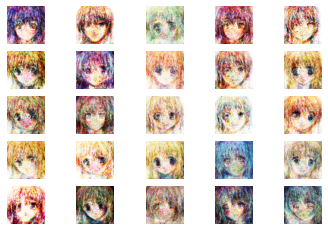

14601 [D loss: 0.065429, acc.: 98.44%] [G loss: 6.709805]
14602 [D loss: 0.021402, acc.: 98.44%] [G loss: 6.205067]
14603 [D loss: 0.069646, acc.: 98.44%] [G loss: 7.338197]
14604 [D loss: 0.032988, acc.: 98.44%] [G loss: 6.510773]
14605 [D loss: 0.081327, acc.: 96.88%] [G loss: 6.292562]
14606 [D loss: 0.108171, acc.: 98.44%] [G loss: 6.544447]
14607 [D loss: 0.050505, acc.: 95.31%] [G loss: 5.845441]
14608 [D loss: 0.130203, acc.: 96.88%] [G loss: 6.089957]
14609 [D loss: 0.036240, acc.: 98.44%] [G loss: 6.520428]
14610 [D loss: 0.020141, acc.: 100.00%] [G loss: 6.646517]
14611 [D loss: 0.011136, acc.: 100.00%] [G loss: 6.631097]
14612 [D loss: 0.115413, acc.: 95.31%] [G loss: 6.834938]
14613 [D loss: 0.060614, acc.: 96.88%] [G loss: 6.646238]
14614 [D loss: 0.051542, acc.: 96.88%] [G loss: 6.837402]
14615 [D loss: 0.086809, acc.: 95.31%] [G loss: 6.300769]
14616 [D loss: 0.213150, acc.: 93.75%] [G loss: 7.299702]
14617 [D loss: 0.056670, acc.: 98.44%] [G loss: 6.403558]
14618 [D los

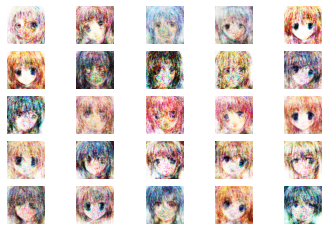

14801 [D loss: 0.018777, acc.: 100.00%] [G loss: 6.238251]
14802 [D loss: 0.031891, acc.: 100.00%] [G loss: 6.675878]
14803 [D loss: 0.223243, acc.: 89.06%] [G loss: 6.284172]
14804 [D loss: 0.085250, acc.: 96.88%] [G loss: 5.980448]
14805 [D loss: 0.156472, acc.: 93.75%] [G loss: 5.897349]
14806 [D loss: 0.039566, acc.: 98.44%] [G loss: 6.757949]
14807 [D loss: 0.032936, acc.: 98.44%] [G loss: 6.832630]
14808 [D loss: 0.107247, acc.: 93.75%] [G loss: 6.535600]
14809 [D loss: 0.049951, acc.: 98.44%] [G loss: 6.203512]
14810 [D loss: 0.021311, acc.: 100.00%] [G loss: 6.288947]
14811 [D loss: 0.044116, acc.: 98.44%] [G loss: 6.713310]
14812 [D loss: 0.042377, acc.: 96.88%] [G loss: 6.881498]
14813 [D loss: 0.240113, acc.: 93.75%] [G loss: 6.732310]
14814 [D loss: 0.087947, acc.: 96.88%] [G loss: 6.813793]
14815 [D loss: 0.056367, acc.: 96.88%] [G loss: 7.451361]
14816 [D loss: 0.039639, acc.: 98.44%] [G loss: 7.617999]
14817 [D loss: 0.123763, acc.: 96.88%] [G loss: 6.284679]
14818 [D lo

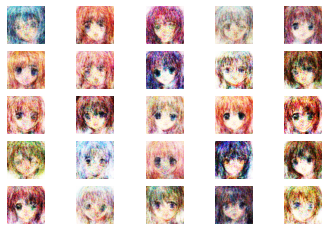

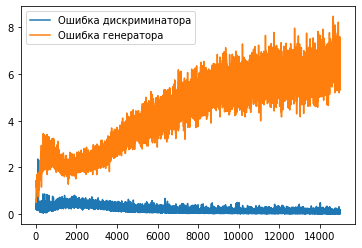

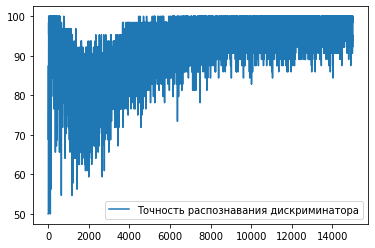

In [ ]:
generator = create_generator() 
discriminator = create_discriminator() 
train(generator, discriminator) 